# Laboratorio 05: Herramientas Avanzadas de Python

### José Alejo Eyzaguirre Ercilla

### Instalación de Librerías.

Antes que nada importamos e instalamos las librerías necesarias. Lamentablemente no pude desarrollar mi Lab en Jupyter Notebook (entorno de preferencia), por lo que tuve que desarrollarlo en **Google Colab**.

In [1]:
!pip3 install geopandas
!apt install libspatialindex-dev
!pip3 install rtree
!pip3 install pygeos
!pip3 install descartes
!pip3 install netorkx
!pip3 install osmnx

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libspatialindex-dev is already the newest version (1.8.5-5).
0 upgraded, 0 newly installed, 0 to remove and 14 not upgraded.
ERROR: Could not find a version that satisfies the requirement netorkx (from versions: none)
ERROR: No matching distribution found for netorkx


## Misión 1: Manipulación de tiempos de viaje.

Su primera misión será crear los DataFrames (un Geo-DataFrame y un DataFrame) con la información proporcionada por Uber. Investigue qué es un archivo JSON o GeoJSON (puede comenzar abriéndolo con el editor de texto, quizás note una estructura muy familiar). Para resolver esta misión guíese por los siguientes pasos:

Luego de ver algunos tutoriales de que es un archivo JSON o mejor dicho Java-Script Object Notation, noté cuales eran sus propiedades y gracias. Al abrirlo notamos rápidamente que su estructura corresponde a múltiples diccionarios que tienen bastante profundidad ya que funciona bajo un esquema de anidación de estos mismos. Pasemos a la primera misión de esta misión.


### Misión 1.A: 
Cree un GeoDataFrame de zonas a partir del JSON. Genere una visualización de las zonas con el método plot().

In [2]:
import geopandas as gpd

/usr/local/lib/python3.6/dist-packages/geopandas/_compat.py:88: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.8.1-CAPI-1.13.3). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [3]:
ls

areas_urbanas.dbf  areas_urbanas.shp      sample_data/        Trazados_red.shp
areas_urbanas.prj  areas_urbanas.shp.xml  santiago_tazs.json  Trazados_red.shx
areas_urbanas.sbn  areas_urbanas.shx      Trazados_red.dbf
areas_urbanas.sbx  Disclaimer.txt         Trazados_red.prj


In [4]:
zonas = gpd.read_file("santiago_tazs.json")

In [5]:
zonas.head()

,ID,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry
0,318,13114,Las Condes,0,1,ID 318,"POLYGON ((-70.50243 -33.41327, -70.50160 -33.4..."
1,311,13114,Las Condes,0,2,ID 311,"POLYGON ((-70.48181 -33.38163, -70.48239 -33.3..."
2,301,13114,Las Condes,0,3,ID 301,"POLYGON ((-70.50838 -33.38215, -70.50831 -33.3..."
3,734,13301,Colina,0,4,ID 734,"POLYGON ((-70.69606 -33.23737, -70.69540 -33.2..."
4,330,13115,Lo Barnechea,0,5,ID 330,"POLYGON ((-70.50891 -33.36313, -70.50852 -33.3..."


In [6]:
zonas.shape

(866, 7)

<AxesSubplot:>

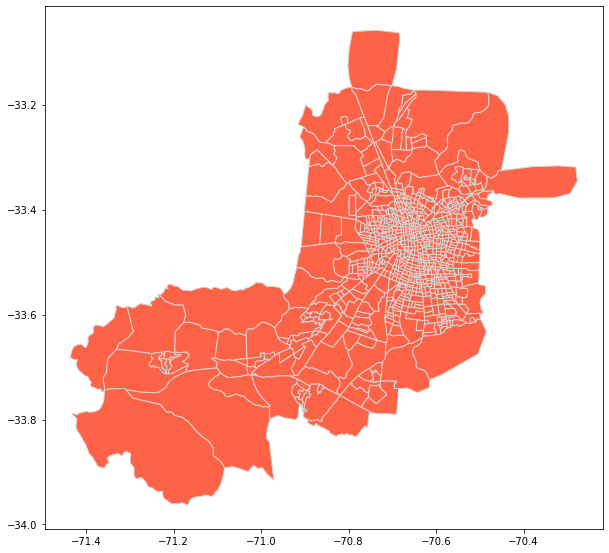

In [7]:
zonas.plot(figsize = (10,10), color = "tomato", edgecolor = "lightgrey")

In [8]:
zonas.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Además del plot podemos notar que el código EPSG de este archivo JSON es **4326**, por lo que este archivo usa las mismas coordenadas que Google Maps.

In [126]:
zonas['Comuna'].value_counts()

Santiago               52
La Florida             45
Puente Alto            42
Maipú                  41
Las Condes             37
Ñuñoa                  30
Peñalolén              28
San Bernardo           25
Pudahuel               25
Recoleta               24
Estación Central       23
Providencia            23
La Reina               22
Quinta Normal          21
Conchalí               20
San Joaquín            20
Vitacura               19
Colina                 19
Macul                  18
Renca                  17
El Bosque              17
Pedro Aguirre Cerda    17
La Cisterna            17
La Granja              16
Cerrillos              16
Quilicura              15
Independencia          15
La Pintana             15
Huechuraba             14
San Miguel             14
Melipilla              14
Cerro Navia            14
Lo Barnechea           13
San Ramón              13
Talagante              12
Lo Prado               12
Lo Espejo              11
Peñaflor               11
Calera de Ta

### Misión 1.B:

Cree un DataFrame de tiempos de viaje a partir del CSV. Genere una visualización de los datos con el método head().

Para los tiempos de viaje, solo se consideraron los de días de semana. Esto porque en misiones futuras se quiere estudiar el tiempo que demoran al trabajo los individuos de las distintas comunas de Santiago, y como en general en Chile la gente solo trabaja de lunes a viernes, estos son los datos más indicados a utilizar.

In [9]:
import pandas as pd

In [10]:
!wget https://www.dropbox.com/s/fw1s4n9z5qpwnpr/Tiempos%20por%20hora%20-%20dia%20semana.csv?dl=0

--2020-12-05 12:32:49--  https://www.dropbox.com/s/fw1s4n9z5qpwnpr/Tiempos%20por%20hora%20-%20dia%20semana.csv?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.82.1, 2620:100:6032:1::a27d:5201
Connecting to www.dropbox.com (www.dropbox.com)|162.125.82.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/fw1s4n9z5qpwnpr/Tiempos%20por%20hora%20-%20dia%20semana.csv [following]
--2020-12-05 12:32:49--  https://www.dropbox.com/s/raw/fw1s4n9z5qpwnpr/Tiempos%20por%20hora%20-%20dia%20semana.csv
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucb9b98b3655d4793e8fea6e6f81.dl.dropboxusercontent.com/cd/0/inline/BEeCA7Si8PlWHPrqIG5UUlZrUMWXEFtq_WAPWvt4gDoSO2KyVA19hIH8APlQTGmmVueio16ctYj7bLGKeAcPfGdhxIzBKf91OKoYHnLZKzXBtVGeI1SWvD92IZk24MreDs4/file# [following]
--2020-12-05 12:32:49--  https://ucb9b98b3655d4793e8fea6e6f81.dl.dropboxusercontent.com/cd/0/inline/BEeCA7Si8PlWH

In [11]:
tiempos = pd.read_csv('/content/Tiempos por hora - dia semana.csv?dl=0', sep = ',')

In [12]:
tiempos.shape

(5716653, 7)

In [13]:
tiempos.head()

,sourceid,dstid,hod,mean_travel_time,standard_deviation_travel_time,geometric_mean_travel_time,geometric_standard_deviation_travel_time
0,855,397,19,1226.20,279.03,1198.30,1.23
1,153,237,23,1841.60,298.54,1818.93,1.17
2,398,141,12,1742.00,264.96,1720.93,1.17
3,228,690,1,306.36,172.41,266.74,1.69
4,278,190,1,599.98,267.48,553.26,1.47


### Misión 1.C: 

Cree una función que reciba el GeoDataFrame de la parte (a), el DataFrame de la parte (b) y el id de una zona origen cualquiera. Su función debe crear una nueva columna en el GeoDataFrame con los tiempos de viaje a todas las zonas desde la zona indicada en el input (id de la zona). Genere una visualización de los tiempos de viaje en la zonas con el método plot() de geopandas.

Dada esta explicación, es importante notar que si aplicamos esta función para todas las zonas, tendremos tantas columnas nuevas como número de zonas. Para resolver lo pedido, se dividirá el problema en una serie de miniproblemas o pasos y luego se agruparán cada una de las partes en la función pedida `creator`. Los pasos y explicaciones de estos mismos, son los siguientes.

1. Filtrar la base de datos `tiempos`, de manera tal de solo quedarnos con los que tienen como nodo de origen el id entregado como input a nuestra función.

2. Filtrar la base de datos resultante según el horario recibido como input. **Si bien, esto no se pedía en la M1c, se estimó conveniente agregar el horario como input ya que facilitará los procesos para realizar la Misión 2 de este Lab**. El profesor Francisco Garrido apoyó esta iniciativa mía en el Foro Discord.

- El dato de horario que se recibirá como input será un número entre 0 a 3. El primer tramo horario será cualquier hora pasada las 20:00 y hasta las 6:00 (incluídas), el segundo será cualquier hora pasada las 6:00 hasta las 10:00 (incluída), el tercero cualquier hora pasada las 10:00 y hasta las 17:00 y el último será cualquier hora pasada las 17:00 y hasta (inclusive) las 20:00. Se utilizaron estos tramos, ya que se cree que estos abarcan o agrupan las distintas "horas de taco" que hay en el día.

3. Dado que se presentan horarios distintos por cada par de nodos origen-destino, se debe agrupar esta base de datos bastante filtrada (una especie de "consulta de SQL"), por `ID` para así entregar un solo valor de tiempo por fila, que en este caso será el tiempo promedio de los distintos tiempos promedio por día, de cada valor de `hod`.

4. Fusionamos o *mergeamos* ambas df, procurando que la dataframe elaborada en los pasos anteriores se ajuste a la base de datos `zonas` y no al revés. Es decir, que se mantenga el número de filas de `zonas` (866) en la nueva GeoDataFrame amplificada.

5. Botamos o *dropeamos* las columnas extras del GeoDataFrame resultante del paso 4.

6. Agrupamos todos estos pasos anteriores en una fusión que entrega 

Comencemos el largo camino:

Partimos inicialmente estudiando el número de Zonas únicas.

In [14]:
ids = set()
for zona in zonas.ID: 
  ids.add(zona)

In [15]:
print(ids)

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 22

In [16]:
print(len(ids))

866


Filtramos el Data Frame de `tiempos` por todas aquellas observaciones que parten en el nodo origen que la función a elaborar pide como input. Se utiliza el ID, 318 a modo de ejemplo.

In [17]:
id = 318
destinos_id = tiempos.loc[tiempos["sourceid"] == id]
destinos_id.head()

,sourceid,dstid,hod,mean_travel_time,standard_deviation_travel_time,geometric_mean_travel_time,geometric_standard_deviation_travel_time
679,318,320,3,861.43,824.66,650.56,1.96
729,318,331,23,916.74,449.99,855.00,1.40
1882,318,9,11,1184.68,219.08,1165.98,1.19
3166,318,37,12,1074.06,380.51,1018.56,1.37
3514,318,79,22,722.54,288.87,675.74,1.43


Observamos que el método de filtración funcionó bien. 

Luego veamos cuantas observaciones distintas (o horas del día distintas) que hay por el par nodo origen y destino: (318, 311).

In [18]:
destinos_id.loc[destinos_id["dstid"] == 311]

,sourceid,dstid,hod,mean_travel_time,standard_deviation_travel_time,geometric_mean_travel_time,geometric_standard_deviation_travel_time
37149,318,311,9,655.85,352.42,594.47,1.51
428190,318,311,12,607.08,517.16,532.81,1.52
619721,318,311,20,650.27,424.13,578.72,1.54
913230,318,311,3,626.80,346.67,557.00,1.58
1266174,318,311,13,661.19,387.58,589.77,1.55
1502510,318,311,7,805.11,430.67,718.65,1.58
1799615,318,311,6,644.04,367.05,565.03,1.63
1961636,318,311,14,702.04,753.13,578.75,1.65
2317765,318,311,21,547.04,232.65,513.49,1.39
2558503,318,311,15,651.58,327.54,593.51,1.50


Notamos que hay uno por cada hora del día (esto no pasa con todos los nodos destino que provienen del nodo origen 318). Esta tabla anterior, nos servirá para comprobar que los resultados que entrega nuestra función definitiva están bien.

Procedemos luego a calcular la media de cada nodo destino de la DataFrame resultante. Cabe destacar, que nuestra función definitiva filtrará previamente por hora del día y luego agrupará calculando la media. Este paso se omitió, porque no es muy distinto a el filtro que se utilizó para obtener solo las observaciones que tienen como nodo origen el nodo recibido como input.

In [19]:
df2 = destinos_id[["dstid", "mean_travel_time"]].groupby('dstid', as_index = False).mean()

Luego "mergeamos" la DataFrame (DF) resultante `df2` con nuestro DF `zonas`. Es importante que la DF resultante se acople a la DF `zonas` y no viceversa. De esta forma nos quedará que para cada uno de los nodos de la tabla `zonas` habrá un nuevo valor correspondiente a la media de los tiempos promedio entre ese nodo y el nodo origen (recibido como input en la función), según el horario entregado, también como input, en la función.

In [20]:
nueva = zonas.merge(df2, how = "left", left_on='ID', right_on='dstid') 
nueva["tiempo desde {}".format(id)] = nueva["mean_travel_time"]
display(nueva.head())

,ID,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry,dstid,mean_travel_time,tiempo desde 318
0,318,13114,Las Condes,0,1,ID 318,"POLYGON ((-70.50243 -33.41327, -70.50160 -33.4...",318.0,415.450000,415.450000
1,311,13114,Las Condes,0,2,ID 311,"POLYGON ((-70.48181 -33.38163, -70.48239 -33.3...",311.0,687.164167,687.164167
2,301,13114,Las Condes,0,3,ID 301,"POLYGON ((-70.50838 -33.38215, -70.50831 -33.3...",301.0,575.444348,575.444348
3,734,13301,Colina,0,4,ID 734,"POLYGON ((-70.69606 -33.23737, -70.69540 -33.2...",NaN,NaN,NaN
4,330,13115,Lo Barnechea,0,5,ID 330,"POLYGON ((-70.50891 -33.36313, -70.50852 -33.3...",330.0,643.248750,643.248750


Luego de todo el camino recorrido agrupamos las distintas partes y creamos la función pedida, que se llamará `creator`.

In [21]:
def creator(zonas, tiempos, id, horario):
  limites = {1: (21,7), 2: (7,11), 3: (11,18), 4: (18,21)}
  desde = limites[horario][0]
  hasta = limites[horario][1]
  #Filtro por nodo origen.
  destinos_id = tiempos.loc[tiempos["sourceid"] == id]
  #Filtro por horario.
  #Como las horas van de 0 a 23, debemos hacer un método especial para el primer horario, que incluye la hora cero.
  if horario == 1:
    destinos_id2 = destinos_id.loc[(destinos_id['hod'] >= desde) | (destinos_id['hod'] < hasta)]
  else:
    destinos_id2 = destinos_id.loc[(destinos_id['hod'] >= desde) & (destinos_id['hod'] < hasta)]
  #Agrupo por nodo destino, para tener un solo tiempo por nodo destino.
  df2 = destinos_id2[["dstid", "mean_travel_time"]].groupby('dstid', as_index = False).mean()
  #"Mergeamos" ambas DataFrames, la creada con la info relevante se acopla al Geodataframe zonas.
  nueva = zonas.merge(df2, how = "left", left_on='ID', right_on='dstid') 
  #Dropeamos columnas extras.
  nueva["Tiempo desde Nodo: {}".format(id)] = nueva["mean_travel_time"]
  nueva.drop("mean_travel_time", axis = 1, inplace = True)
  nueva.drop("dstid", axis = 1, inplace = True)
  #Listo
  return nueva

In [22]:
paracolorear = creator(zonas, tiempos, 734, 4)

In [23]:
paracolorear.head()

,ID,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry,Tiempo desde Nodo: 734
0,318,13114,Las Condes,0,1,ID 318,"POLYGON ((-70.50243 -33.41327, -70.50160 -33.4...",NaN
1,311,13114,Las Condes,0,2,ID 311,"POLYGON ((-70.48181 -33.38163, -70.48239 -33.3...",2048.86
2,301,13114,Las Condes,0,3,ID 301,"POLYGON ((-70.50838 -33.38215, -70.50831 -33.3...",NaN
3,734,13301,Colina,0,4,ID 734,"POLYGON ((-70.69606 -33.23737, -70.69540 -33.2...",NaN
4,330,13115,Lo Barnechea,0,5,ID 330,"POLYGON ((-70.50891 -33.36313, -70.50852 -33.3...",NaN


In [24]:
tablita = paracolorear['Tiempo desde Nodo: 734'].loc[paracolorear['ID'] == 735]
tablita.values[0]


1243.6333333333334

<AxesSubplot:>

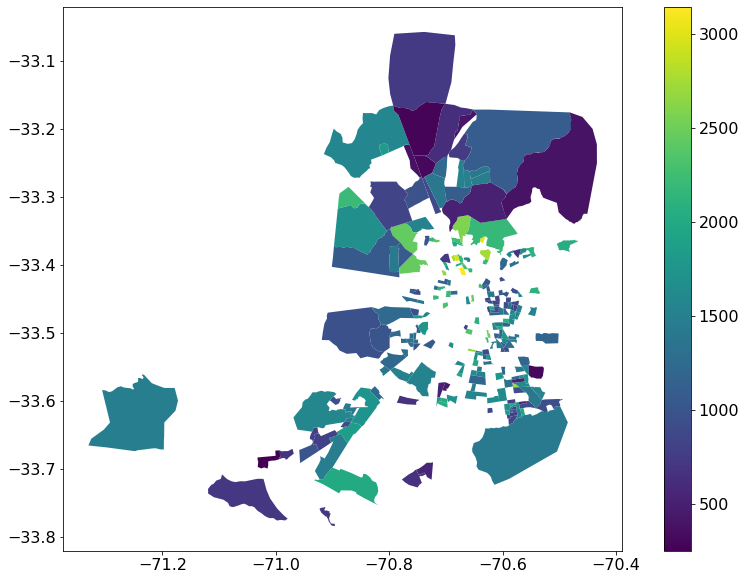

In [25]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]
plt.rcParams.update({'font.size': 16})
paracolorear.plot(column = "Tiempo desde Nodo: 734", legend= True)

Dado que en el gráfico anterior no se aprecia bien la distribución de las zonas. Se hará un nuevo gráfico que tenga como fondo el gráfico representado en la Misión 1A.

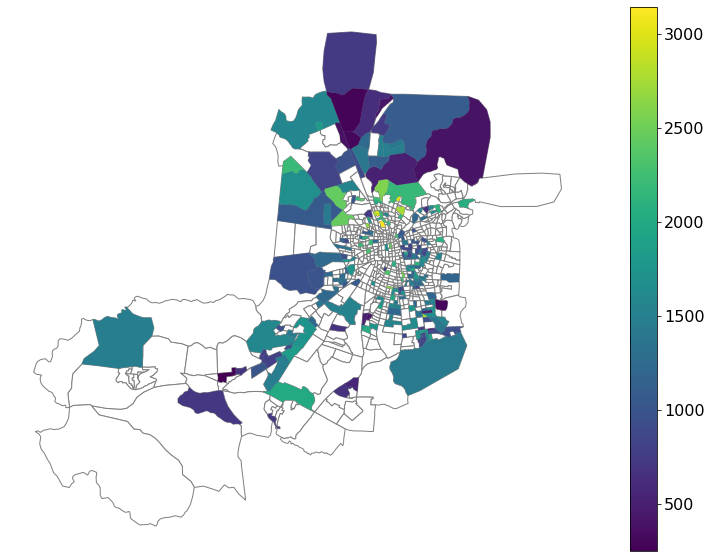

In [26]:
ax = zonas.plot(color = "white", edgecolor = "grey")
paracolorear.plot(ax = ax, column = "Tiempo desde Nodo: 734" , legend = True)
plt.axis('off')
plt.show()

De esta forma podemos notar más claramente los distintos nodos de la Data de Uber que dividen Santiago. Los más morados son a los que se puede llegar más rápido, y los más amarillos o verdes, lo que más demoramos en llegar.

Los blancos, son de los que no hay data para ese par nodo-origen / nodo-destino, y para ese momento del día que abarca el horario entregado como input.

## Misión 2: Velocidades a Nivel de Red.

En esta misión deberá añadir información de velocidades a los arcos de la red vial de Santiago para distintos tramos horarios. Para llevar a cabo la misión, guíese con los siguientes pasos:



### Misión 2.A:

Utilice el archivo Shape de las zonas urbanas de Chile para obtener la zona urbana de Santiago. A partir de la zona urbana obtenida, obtenga mediante la librería de `osmnx` la vialidad contenida dentro del polígono la zona urbana.

Primero visualizamos el área urbana de Santiago de Chile. Luego debemos obtener las vialidades contenidas dentro de este polígono, graficado más abajo de color verde.

In [27]:
df_urbano = gpd.read_file('areas_urbanas.shp')

In [28]:
df_urbano.head()

,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area,geometry
0,Chiguayante,Ciudad,29855.998337,1.038076e+07,"POLYGON ((140044.634 5911024.284, 140051.361 5..."
1,Lota,Ciudad,14233.349738,5.262642e+06,"POLYGON ((131359.666 5889462.902, 131475.343 5..."
2,Coronel,Ciudad,41577.791832,1.551685e+07,"POLYGON ((127278.440 5896965.436, 127411.675 5..."
3,San Rosendo,Ciudad,6499.369423,1.534402e+06,"POLYGON ((168583.830 5870293.970, 168725.579 5..."
4,Concepción,Ciudad,82986.894378,3.454227e+07,"POLYGON ((133504.854 5919782.212, 136052.580 5..."


<AxesSubplot:>

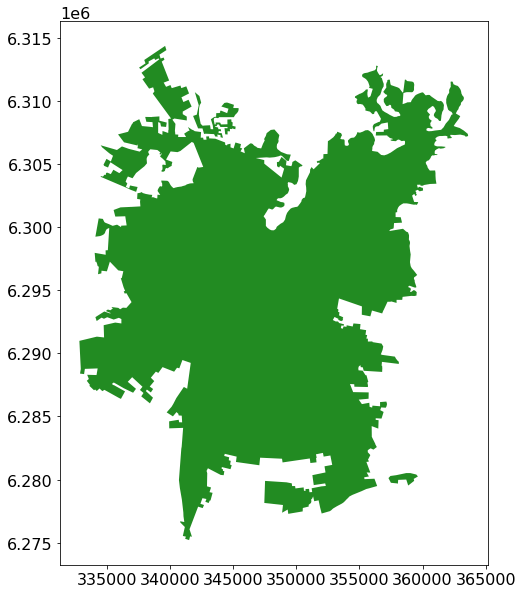

In [29]:
df_urbano.loc[df_urbano["NOMBRE"] == "Santiago"].plot(color = "forestgreen")

Para conocer mejor los datos de este archivo, debemos estudiar el código EPSG de zona_urbana.

In [30]:
df_urbano.crs

<Projected CRS: EPSG:32719>
Name: WGS 84 / UTM zone 19S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 72°W and 66°W, southern hemisphere between 80°S and equator, onshore and offshore. Argentina. Bolivia. Brazil. Chile. Colombia. Peru.
- bounds: (-72.0, -80.0, -66.0, 0.0)
Coordinate Operation:
- name: UTM zone 19S
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Notamos que este tiene un código de EPSG de **32719**. Esto significa que difiere del código que usa Google Maps, por ende si queremos hacer joins con información de esta tabla con la Geodataframe `zonas`, debemos antes modificar las coordenadas utilizadas. Como queremos obtener las vialidades dentro de esta zona urbana, y la librería OSMNX trabaja con las mismas coordenadas de Google Maps (EPSG: 4326), convertimos al tiro las geometrías a esta forma.



In [31]:
df_urbano2 = df_urbano.to_crs(4326)

In [32]:
figura = []

for num in df_urbano2.loc[df_urbano["NOMBRE"] == "Santiago"]["geometry"]:
  figura.append(num)

print(type(figura[0]))

poligono = figura[0]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


En lo siguiente se procederá a encontrar las vialidades contenidas dentro del área urbana de Santiago. Sin embargo antes, visualizaremos las vialidades de la comuna de Las Condes, para apreciar lo poderosa que es esta librería.

In [33]:
import networkx as nx
import osmnx as ox

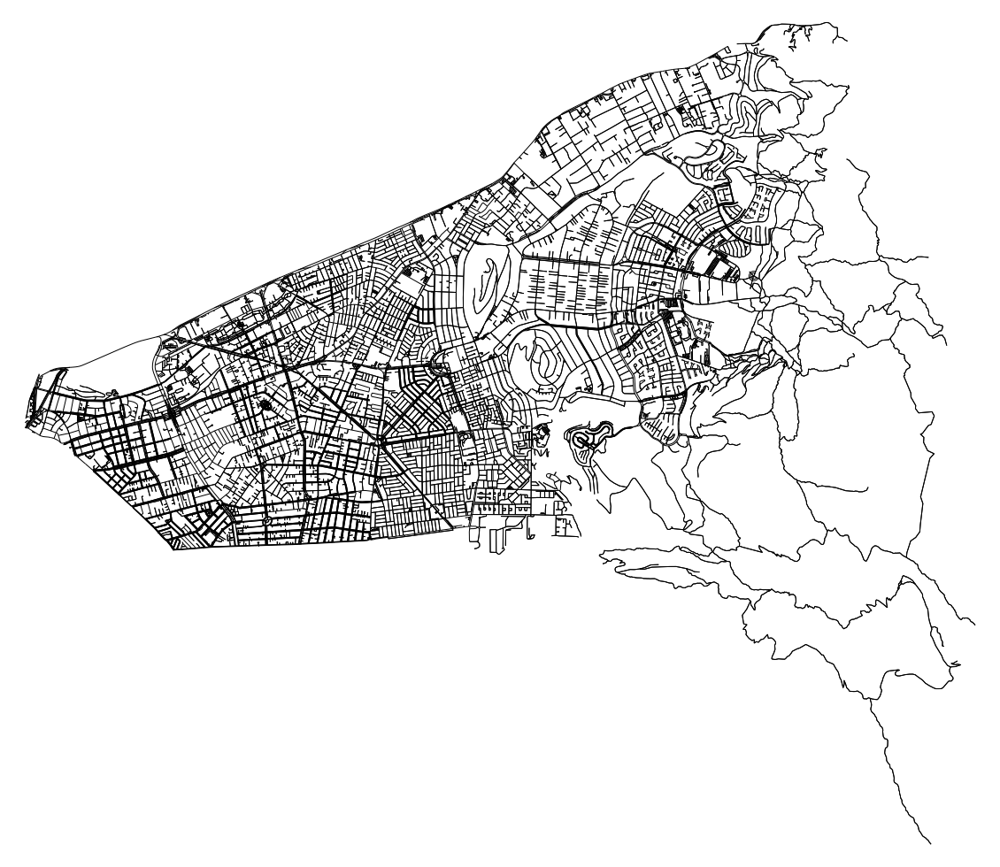

(<Figure size 1440x1440 with 1 Axes>, <AxesSubplot:>)

In [34]:
ox.plot_graph(ox.graph_from_place('Las Condes, Chile'), figsize = (20,20), bgcolor = 'w', node_color = 'red', edge_color = 'black', node_alpha = 0)

Habiendo visto, la representación de las vialidades de la comuna de Las Condes, procedemos a extraer todas las vialidades que estén dentro de la zona urbana de Santiago. Para ello se usa el método de `osmnx`, llamado *graph_from_polygon*. A este le entregamos el multipolígono, que es la geometría que envuelve el área urbana de la ciudad de Santiago, y le pedimos que guarde en el objeto `vialidades_urbanas`. Este objeto es un multidigraph. 

In [35]:
vialidades_urbanas = ox.graph_from_polygon(poligono, network_type= 'drive')

In [36]:
type(vialidades_urbanas)

networkx.classes.multidigraph.MultiDiGraph

Para graficar este multidigraph creado, debemos seguir los siguientes pasos. Cabe mencionar, que no se denotaron en el gráfico los nodos. Esto se omitió ya que al añadirlos a la visualización, no se alcanzaban a apreciar las miles de vialidades que contiene nuestra capital.

In [37]:
vu_projected = ox.project_graph(vialidades_urbanas)

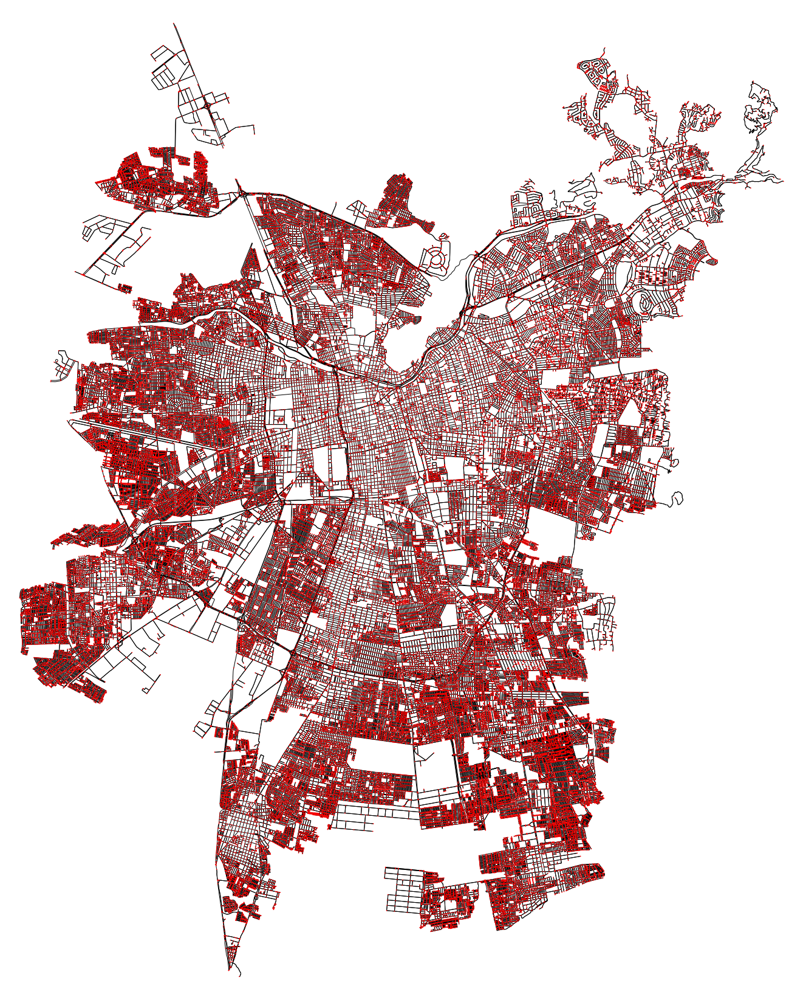

(<Figure size 2160x2160 with 1 Axes>, <AxesSubplot:>)

In [38]:
ox.plot_graph(vu_projected, figsize = (30,30), bgcolor = 'w', node_color = 'red', node_size=3, edge_color = 'black')

### Misión 2.B:

Defina una metodología propia que permita incorporar a la vialidad las velocidades presentes en arcos de la red vial. Las velocidades deben ser obtenidas a partir de la información de tiempos de viaje generada en la M1. Debe explicar detalladamente la lógica utilizada y justificarla para que tenga sentido. Puede ayudarse con los métodos disponibles en la librería de osmnx, geopandas o cualquier otra librería que encuentre útil (referenciando cuando corresponda). Finalizada esta parte, deberá tener un Shape de la red vial en donde donde cada geometría de vialidad (LineString) incluya información de la velocidad para distintos horarios del día. Ustedes es libre de definir el nivel de agregación temporal en base a los datos, siempre y cuando tenga al menos cuatro horarios diferentes. Genere una visualización con esquema de color de las velocidades para cuatro horarios diferentes.

En esta misión hubo un trabajo previo muy arduo, de "craneación" de los pasos a seguir. La dificultad radica en que para obtener la velocidad promedio de una vía se requiere la distancia de la vialidad y también el tiempo que se demora en recorrerla en ese momento del día. 

La distancia la podemos obtener sin problemas de la librería Open Street Map. Sin embargo, el tiempo no es tan fácil conseguirlo. En la M1, solo tenemos tiempos de viaje entre una zona y otra. Pero es de esperar que tengamos vías que están dentro de una misma zona, por lo que si usamos estos tiempos, moverse dentro de una zona tendrá tiempo indefinido. Además no sabemos como podría distribuirse el tiempo entre las vías que se usan para llegar a otra zona desde una zona en específico. 

Se procederá entonces a probar con distintas formas. Inicialmente se consideró útil estudiar la funcionalidad del módulo de Open Street Map: **add_edge_speed**. Se procederá a agregar a nuestro multi-di-graph las velocidades de cada edge, según la velocidad permitida para recorrer esa vía urbana. Esta "nueva columna" del GeoDataFrame, se utilizará más adelante.

Para resolver este desafío se consideró oportuno hacer el siguiente proceso, para cada par de zonas aledañas:

1. Seleccionar aleatoriamente **x** nodos de una zona y **x** de su zona vecina (para ello hay que definir previamente, cuales son las zonas vecinas).

2. Habiendo seleccionado estos nodos, se procede a calcular el shortest path (con weight = `travel_time`, el camino más RÁPIDO según OSMNX) entre cada una de las posibles combinaciones de nodos entre la zona y su zona vecina. Teniendo cada una de las **y** rutas posibles, se tomará una ruta, y luego calcularé el tiempo promedio demorado en cada uno de los arcos (usando la velocidad entregada por Open Street Map y la distancia de cada arco). Para terminar este paso, se sumará el tiempo demorado en recorrer cada uno de los arcos que compone esta ruta. Repetimos este proceso para cada unas de las **y** rutas obtenidas en el paso 2. 
- En vez de hacer lo anterior tal cual, se utilizó el método de Open Street Map: `shortest_path_length`, con el weight `travel time`. De esta forma obtenemos el tiempo total demorado en la ruta completa. Emulando lo que se quería hacer en este paso 3. Teniendo en mano el tiempo demorado en cada una de las rutas, se calcula el tiempo promedio total, demorado en cada una de las **y** rutas.

3. Se divide el tiempo promedio que Uber dice que nos demoramos en cruzar de esa zona a su vecina específica, en un cierto momento del día.

4. El cuociente obtenido en 5, se utiliza para multiplicar cada una de las velocidades de los arcos obtenidas con el método de open street map `add_egde_speed`.

5. Si hay arcos que son compartidos por distintas rutas, no nos complicaremos y dejaremos cualquiera de las dos velocidades, obtenidas en el paso 6.

6. Los arcos que no forman parte de alguna de estas **y** rutas (*arcos repudiados*), llevarán la velocidad entregada por open street map, sin importar el momento del día. El número de arcos repudiados, decrece con un mayor nivel de x. Lamentablemente mi computador no es tan bueno, así que utilizaré un número no grande de **x**. Pero los invito, a usar un número mayor en sus computadores más *pros*. 


#### Agregando Velocidades de Open Street Map a las vialidades.

Primero guardamos el  Multi-DiGraph obtenido en la Misión 2A, de manera tal de tener la información de sus nodos y de sus arcos (vialidades) en un GeoDataFrame. Habiendo realizado esto, se hacer rápidas visualizaciones de los DF obtenidos para entender mejor su composición y lograr una mayor familiarización con los datos.

In [39]:
vialidades_urbanas2 = ox.add_edge_speeds(vialidades_urbanas, precision=1)

In [40]:
vialidades_urbanas3 = ox.add_edge_travel_times(vialidades_urbanas, precision=2)

In [41]:
ox.save_graph_shapefile(vialidades_urbanas3)

In [42]:
ls

 areas_urbanas.dbf       Disclaimer.txt
 areas_urbanas.prj       sample_data/
 areas_urbanas.sbn       santiago_tazs.json
 areas_urbanas.sbx      'Tiempos por hora - dia semana.csv?dl=0'
 areas_urbanas.shp       Trazados_red.dbf
 areas_urbanas.shp.xml   Trazados_red.prj
 areas_urbanas.shx       Trazados_red.shp
 data/                   Trazados_red.shx


In [43]:
nodos = gpd.read_file('data/graph_shapefile/nodes.shp')

In [44]:
arcos = gpd.read_file('data/graph_shapefile/edges.shp')

**Visualización de los nodos:**

In [45]:
nodos.head()

,y,x,osmid,highway,ref,geometry
0,-33.442901,-70.646254,386138,traffic_signals,None,POINT (-70.64625 -33.44290)
1,-33.443139,-70.647294,386139,None,None,POINT (-70.64729 -33.44314)
2,-33.443075,-70.647638,386140,traffic_signals,None,POINT (-70.64764 -33.44307)
3,-33.443391,-70.648980,386145,traffic_signals,None,POINT (-70.64898 -33.44339)
4,-33.436995,-70.658425,386157,traffic_signals,None,POINT (-70.65842 -33.43699)


In [46]:
nodos.shape

(96911, 6)

In [47]:
nodos['highway'].value_counts()

traffic_signals             3527
motorway_junction            211
turning_circle                96
crossing                      56
bus_stop                       6
give_way                       6
stop                           4
turning_loop                   3
toll_gantry                    2
traffic_signals;crossing       1
Name: highway, dtype: int64

**Visualización de las Vialidades (con sus respectivas velocidades):**

In [48]:
arcos.tail()

,osmid,oneway,name,highway,length,speed_kph,travel_tim,from,to,lanes,maxspeed,access,bridge,tunnel,ref,junction,width,service,landuse,u,v,key,geometry
143760,862371763,1,None,unclassified,22.720,41.2,1.99,8034264648,8034264646,1,None,None,None,None,None,None,None,None,None,8034264646,8034264648,0,"LINESTRING (-70.75656 -33.49305, -70.75660 -33..."
143761,862867962,0,Pasaje Isabel La Católica,living_street,34.760,33.4,3.75,8038379821,8038379820,None,None,None,None,None,None,None,None,None,None,8038379820,8038379821,0,"LINESTRING (-70.67081 -33.52698, -70.67094 -33..."
143762,863550498,0,Avenida Vitacura,residential,61.047,40.3,5.45,8044423918,8044423916,None,None,None,None,None,None,None,None,None,None,8044423916,8044423918,0,"LINESTRING (-70.55048 -33.38353, -70.55042 -33..."
143763,863992791,0,None,residential,54.666,40.3,4.88,8048823222,8048823220,None,None,None,None,None,None,None,None,None,None,8048823220,8048823222,0,"LINESTRING (-70.67322 -33.58786, -70.67309 -33..."
143764,880014979,0,Ricardo Fossati,residential,57.048,40.3,5.10,8185865739,8185865738,None,None,None,None,None,None,None,None,None,None,8185865738,8185865739,0,"LINESTRING (-70.64359 -33.50124, -70.64419 -33..."


In [49]:
arcos['highway'].value_counts()

residential                          73188
living_street                        29490
tertiary                             17670
secondary                            12209
primary                               8488
primary_link                           627
unclassified                           547
motorway_link                          480
motorway                               373
secondary_link                         333
['residential', 'living_street']       186
tertiary_link                          146
['residential', 'unclassified']          7
['residential', 'tertiary']              4
['primary', 'primary_link']              3
['motorway_link', 'tertiary']            2
['secondary', 'primary_link']            2
['motorway_link', 'motorway']            2
['motorway_link', 'primary']             1
['primary', 'motorway']                  1
['residential', 'secondary_link']        1
planned                                  1
['residential', 'primary_link']          1
['motorway_

In [50]:
arcos.shape

(143765, 23)

In [51]:
import numpy as np
arcos['speed_kph'].describe()

count    143765.000000
mean         41.488312
std           6.859976
min           5.000000
25%          40.300000
50%          40.300000
75%          46.900000
max         120.000000
Name: speed_kph, dtype: float64

#### 1. Seleccinando Nodos Aleatorios:

Se procederá a definir una función que seleccione nodos aleatorios de cada zona. Para obtener esta función se necesita primero *linkear* nuestro nuevo GeoDataFrame de nodos (compuesto por puntos) a nuestro GeoDF de `zonas`, así podemos saber a que zona pertenece cada nodo.

Además se debe definir que es una zona vecina.

Partamos por lo primero:

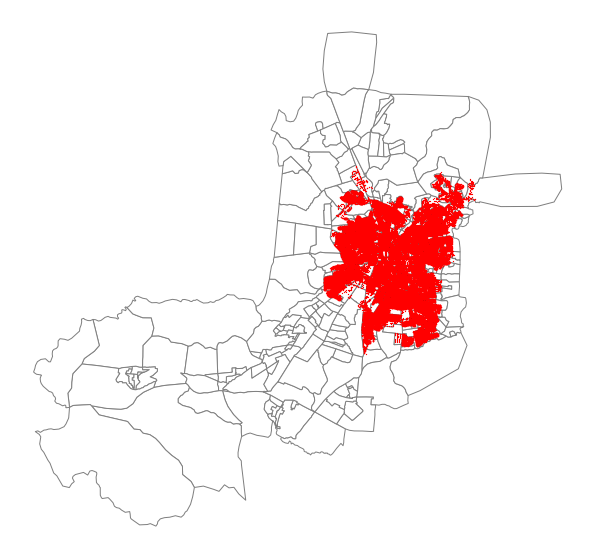

In [52]:
ax = zonas.plot(color = "white", edgecolor = "grey")
nodos.plot(ax = ax, color = "red", markersize= 0.1, marker = 'x')
plt.axis('off')
plt.show()

Para agilizar el proceso de encontrar la zona correspondiente a cada nodo, se filtrarán las zonas que están dentro de Santiago Urbano.

In [53]:
zonas2 = gpd.sjoin(zonas, nodos, op='intersects', how = 'inner')

In [54]:
zonas2.head()

,ID,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry,index_right,y,x,osmid,highway,ref
0,318,13114,Las Condes,0,1,ID 318,"POLYGON ((-70.50243 -33.41327, -70.50160 -33.4...",2162,-33.396395,-70.503986,250439362,None,None
0,318,13114,Las Condes,0,1,ID 318,"POLYGON ((-70.50243 -33.41327, -70.50160 -33.4...",94407,-33.396373,-70.504095,6214163543,None,None
1,311,13114,Las Condes,0,2,ID 311,"POLYGON ((-70.48181 -33.38163, -70.48239 -33.3...",11296,-33.378863,-70.499325,267081780,None,None
1,311,13114,Las Condes,0,2,ID 311,"POLYGON ((-70.48181 -33.38163, -70.48239 -33.3...",5283,-33.378786,-70.494862,263458592,None,None
1,311,13114,Las Condes,0,2,ID 311,"POLYGON ((-70.48181 -33.38163, -70.48239 -33.3...",5287,-33.378622,-70.500013,263458870,None,None


In [55]:
revisar = zonas2[['ID','geometry']]

In [56]:
revisar = revisar.drop_duplicates()

En la siguiente gráfica podemos ver como queda el mapa que contiene las zonas que tocan en algún punto algún nodo de alguna vialidad correspondiente a Santiago Urbano.

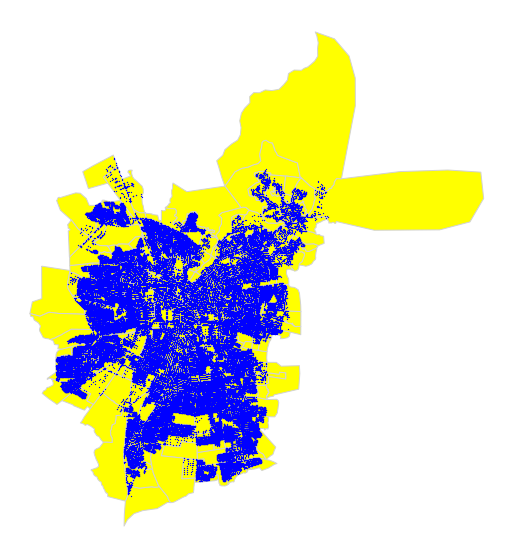

In [57]:
ax = revisar.plot(color = "yellow", edgecolor = "lightgrey")
nodos.plot(ax = ax, color = "blue", markersize= 0.1, marker = 'x')
plt.axis('off')
plt.show()

Ahora debo crear una función del tipo `lambda` que reciba un nodo y te devuelva la zona. Para esto se utilizó información de la siguiente página web: https://automating-gis-processes.github.io/CSC18/lessons/L4/point-in-polygon.html#point-in-polygon-using-geopandas


In [58]:
nodos.loc[0, 'geometry'].within(zonas.loc[0, 'geometry'])

False

In [59]:
diccio = {}
for i in range(len(revisar)):
  diccio[revisar.iloc[i, 0]] = revisar.iloc[i, 1]

print(diccio)

{318: <shapely.geometry.polygon.Polygon object at 0x7fb53be665f8>, 311: <shapely.geometry.polygon.Polygon object at 0x7fb53be66e10>, 301: <shapely.geometry.polygon.Polygon object at 0x7fb53468a7b8>, 316: <shapely.geometry.polygon.Polygon object at 0x7fb53468a940>, 330: <shapely.geometry.polygon.Polygon object at 0x7fb53468a748>, 329: <shapely.geometry.polygon.Polygon object at 0x7fb53f7269e8>, 328: <shapely.geometry.polygon.Polygon object at 0x7fb531e84c88>, 335: <shapely.geometry.polygon.Polygon object at 0x7fb531e84940>, 644: <shapely.geometry.polygon.Polygon object at 0x7fb531e84b00>, 650: <shapely.geometry.polygon.Polygon object at 0x7fb531e847b8>, 332: <shapely.geometry.polygon.Polygon object at 0x7fb531e846a0>, 325: <shapely.geometry.polygon.Polygon object at 0x7fb531e9c9e8>, 681: <shapely.geometry.polygon.Polygon object at 0x7fb531e9ca20>, 673: <shapely.geometry.polygon.Polygon object at 0x7fb531e9c898>, 309: <shapely.geometry.polygon.Polygon object at 0x7fb531e9c8d0>, 676: <sha

In [168]:
def encontrar_zona(nodo, dfzonas = diccio):
  for id in dfzonas.keys():
    if nodo.touches(dfzonas[id]) or nodo.within(dfzonas[id]):
      return int(id)

In [169]:
encontrar_zona(nodos.loc[0, 'geometry'])

48

In [62]:
nodos['zonas'] = nodos['geometry'].apply(lambda x : encontrar_zona(x))

In [63]:
nodos.tail()

,y,x,osmid,highway,ref,geometry,zonas
96906,-33.576563,-70.576719,8126381736,None,None,POINT (-70.57672 -33.57656),701.0
96907,-33.598770,-70.581933,8126827694,None,None,POINT (-70.58193 -33.59877),690.0
96908,-33.581651,-70.578471,8155425376,None,None,POINT (-70.57847 -33.58165),722.0
96909,-33.501102,-70.644186,8185865738,None,None,POINT (-70.64419 -33.50110),646.0
96910,-33.501237,-70.643593,8185865739,None,None,POINT (-70.64359 -33.50124),646.0


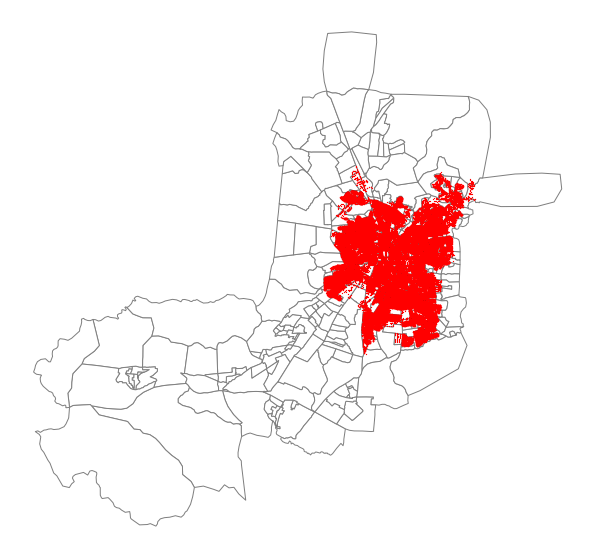

In [64]:
#Graficar nodo con su zona

ax = zonas.plot(color = "white", edgecolor = "grey")
nodos.plot(ax = ax, color = "red", markersize= 0.1, marker = 'x')
plt.axis('off')
plt.show()

In [65]:
nodos.apply(lambda x: sum(x.isnull()),axis=0) 

y               0
x               0
osmid           0
highway     92999
ref         96759
geometry        0
zonas         340
dtype: int64

In [66]:
nodos.shape

(96911, 7)

In [67]:
#nodos.drop("zonas", axis = 1, inplace = True)

Notamos que ahora tenemos que para casi cada nodo, este tiene su ID de zona respectiva.  Esto nos permitirá más adelante elegir por cada zona un número **x** de nodos aleatorios. Lamentablemente hay 340 nodos, a los cuales no se les asignó ninguna zona. Esto, la verdad es que no logré entender por qué pasaba, dado que se consideró que un nodo pertenece a una zona es específico, si está dentro de el o si está sobre su frontera. El considerar todas las zonas, y no solo las filtradas de `revisar`, tampoco ayudó. Por todo esto, se hizo caso omiso de estos valores faltantes que corresponden al 0.0035% de los nodos originales.

Si bien tengo claro que la idea era no usar tanto Python. Lamentablmente, los múltiples códigos que ideé se centraban más en funciones del tipo lambda, no eran tan eficientes (y demoraban infinito en ejecutarse), así que preferí implementar la función `encontrar_zona` como se encuentra más arriba.

Ahora procederemos a definir rápidamente lo que es una zona vecina de otra zona.

Con el siguiente for loop, pudimos obtener los vecions de cada una de las zonas, y así tenemos una nueva columna `vecinos` que contiene para cada zona, una lista con sus respectivos vecinos. Esta idea de código fue sacada de: https://gis.stackexchange.com/questions/281652/find-all-neighbors-using-geopandas/281676

Al código se le implementaron una serie de `try` y `except` para poder lidiar con las excepciones levantadas, al estudiar que polígonos tocan o colindan con otros.


In [68]:
#zonas["vecinos"] = None 

#for index, row in zonas.iterrows():
    #try:
      #vecinos = zonas[zonas.geometry.touches(row['geometry'])].ID.tolist()
    #except:
      #pass 
    #try: 
      #vecinos = vecinos.remove(row.ID)
    #except:
      #pass
    #zonas.at[index, "vecinos"] = vecinos

In [69]:
zonas["vecinos"] = None 

for index, row in zonas.iterrows():
    try:
      vecinos = np.array(zonas[zonas.geometry.touches(row['geometry'])].ID)
    except:
      pass
    try:
      overlap = np.array(zonas[zonas.geometry.overlaps(row['geometry'])].ID)
    except:
      pass
    vecinos = np.union1d(vecinos, overlap) 
    try: 
      vecinos = vecinos.remove(row.ID)
    except:
      pass
    zonas.at[index, "vecinos"] = vecinos

Habiendo añadido los vecinos, estudiamos si estos fueron bien implementados a simple vista. Vemos la comuna de Santiago y al parecer los vecinos fueron seleccionados de buena manera. Estoy consiente que quizás algunos vecinos no fueron encontrados perfectamente, pero como este estudio es un estudio *juvenil*, espero que hagan vista gorda jaja.

In [70]:
zonas.loc[zonas['Comuna'] == 'Vitacura']

,ID,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry,vecinos
21,681,13132,Vitacura,0,22,ID 681,"POLYGON ((-70.54118 -33.38694, -70.54128 -33.3...","[299, 315, 673, 674, 680]"
22,673,13132,Vitacura,0,23,ID 673,"POLYGON ((-70.53300 -33.37942, -70.53268 -33.3...","[298, 310, 315, 327, 674, 681]"
24,676,13132,Vitacura,0,25,ID 676,"POLYGON ((-70.55690 -33.37862, -70.55705 -33.3...","[672, 674, 679, 680]"
25,668,13132,Vitacura,0,26,ID 668,"POLYGON ((-70.57849 -33.39440, -70.57585 -33.3...","[666, 667, 669, 677]"
32,680,13132,Vitacura,0,33,ID 680,"POLYGON ((-70.54401 -33.37519, -70.54490 -33.3...","[299, 313, 670, 671, 674, 676, 679, 681]"
33,679,13132,Vitacura,0,34,ID 679,"POLYGON ((-70.55690 -33.37862, -70.55568 -33.3...","[669, 671, 672, 676, 680]"
34,671,13132,Vitacura,0,35,ID 671,"POLYGON ((-70.55900 -33.38574, -70.55622 -33.3...","[669, 670, 679, 680]"
35,670,13132,Vitacura,0,36,ID 670,"POLYGON ((-70.55975 -33.39031, -70.55779 -33.3...","[299, 300, 313, 669, 671, 680]"
36,669,13132,Vitacura,0,37,ID 669,"POLYGON ((-70.56491 -33.38693, -70.56469 -33.3...","[300, 321, 668, 670, 671, 677, 679]"
46,682,13132,Vitacura,0,47,ID 682,"POLYGON ((-70.59056 -33.39464, -70.58925 -33.3...","[287, 307, 506, 666, 677, 683]"


<AxesSubplot:>

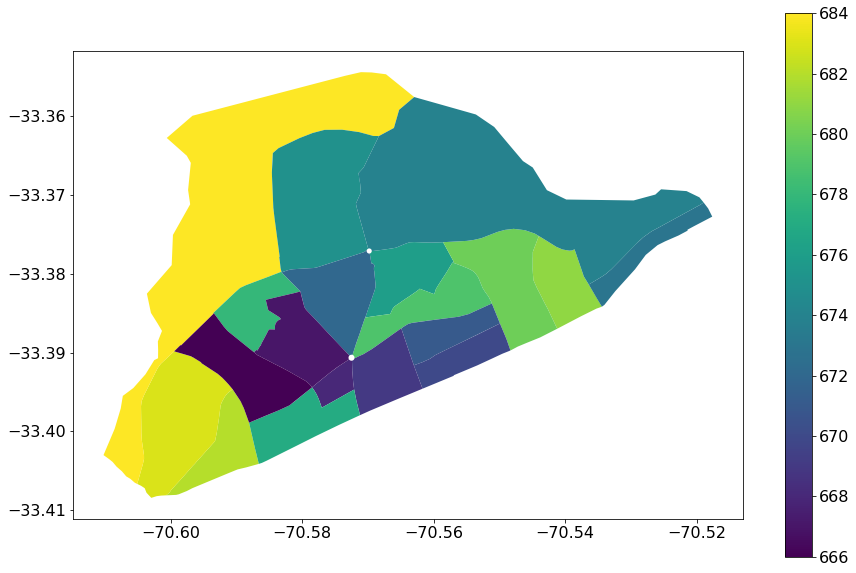

In [71]:
zonas.loc[zonas['Comuna'] == 'Vitacura'].plot(column = 'ID', legend = True)

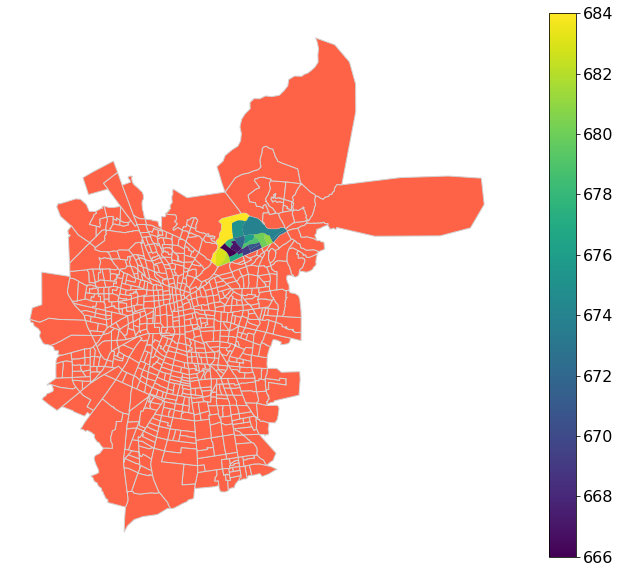

In [72]:
ax = revisar.plot(color = "tomato", edgecolor = "lightgrey")
zonas.loc[zonas['Comuna'] == 'Vitacura'].plot(ax = ax, column = 'ID', legend = True)
plt.axis('off')
plt.show()


El procedimiento para seleccionar aleatoriamente nodos, de una zona en específico, se implementará al agrupar cada uno de los pasos. Pero la idea es extrer una serie de números aleatorios, dentro del intervalo que va de cero hasta el número de nodos de esa zona es específico y luego extraer los nodos seleccionados con el método `.iloc()`. Estos nodos seleccionados junto a los seleccionados de la otra zona, serán a los que se les calculará el camino mínimo entre ellos más adelante.

El código se verá de la siguiente manera:

In [73]:
#nodos['zonas'] = nodos['zonas'].apply(lambda x : try int(x)) 

In [74]:
def numerizar(elem):
  try:
    num = int(elem)
    return num
  except:
    pass

In [75]:
nodos['zonas'] = nodos['zonas'].apply(lambda x : numerizar(x))

In [76]:
nodos.head()

,y,x,osmid,highway,ref,geometry,zonas
0,-33.442901,-70.646254,386138,traffic_signals,None,POINT (-70.64625 -33.44290),48.0
1,-33.443139,-70.647294,386139,None,None,POINT (-70.64729 -33.44314),48.0
2,-33.443075,-70.647638,386140,traffic_signals,None,POINT (-70.64764 -33.44307),20.0
3,-33.443391,-70.648980,386145,traffic_signals,None,POINT (-70.64898 -33.44339),20.0
4,-33.436995,-70.658425,386157,traffic_signals,None,POINT (-70.65842 -33.43699),13.0


In [77]:
nodos.loc[nodos['zonas'] == 318]

,y,x,osmid,highway,ref,geometry,zonas
2162,-33.396395,-70.503986,250439362,None,None,POINT (-70.50399 -33.39639),318.0
94407,-33.396373,-70.504095,6214163543,None,None,POINT (-70.50409 -33.39637),318.0


In [78]:
import random

def seleccion_nodos(id_zona, nodos, x):
  '''Recibe un ID de una zona y retorna x nodos seleccionados aleatoriamente'''
  df = nodos.loc[nodos['zonas'] == id_zona]
  if x > len(df):
    x = len(df)
  lista = list()
  while len(lista) != x:
    num = random.randint(0, len(df)-1)
    if num not in lista:
      lista.append(num)
  seleccion = []
  for num in lista:
    seleccion.append(df.iloc[num, 2])

  return seleccion

seleccion_nodos(318, nodos, 2)

[250439362, 6214163543]

De esta forma, obtenemos el osmid de 5 nodos distintos, de manera tal que ya podemos encontrar el shortest path entre todas las posibles combinaciones entre los **x** nodos seleccionados de esta zona y una de sus zonas vecinas.

Entonces se aplicará esta función para la zona, y luego para cada uno de sus vecinos.

#### 2. Shortest Path entre nodos.

Luego de haber seleccionado los **x** nodos de manera aleatoria de dos zonas aledañas o vecinas. Procederemos a encontrar el camino más rápido entre ambos nodos. Para ello crearemos una función que encuentre el camino más rápido para cada posible combinación de estos nodos. 
Para encontrar cada posible combinación (sin repetición) usaremos la librería `itertools` en especial su paquete de `combinations`. 

Entonces para una zona en específico, seleccionaremos una de sus vecinas (que se encuentra en la columna `vecinos` del  GeoDF `zonas`) y luego obtendremos los **x** nodos aleatorios de ambas zonas.

Para seleccionar los vecinos de una zona en específico debemos hacer lo siguiente:



In [79]:
for i in range(4):
  print('ESTE ES EL ID: ' + str(zonas.loc[i, "ID"]))
  for vecino in zonas.loc[i,"vecinos"]:
    print(vecino)

ESTE ES EL ID: 318
301
302
ESTE ES EL ID: 311
310
327
328
ESTE ES EL ID: 301
302
310
316
318
ESTE ES EL ID: 734
728
729
733
735
736
741


Notamos que de esta forma se puede seleccionar cada uno de los vecinos de una zona es específico (usando el segundo for loop).

Procedemos ahora a señalar como se calcula el camino, o ruta más corta, entre dos nodos. Para ello primero debemos entender bien como se puede lograr calcular la ruta más corta con la estructura de GeoDF y MultiDiGraph´s que tenemos hasta el momento.

In [80]:
nodos[nodos['zonas'] == 318].head()

,y,x,osmid,highway,ref,geometry,zonas
2162,-33.396395,-70.503986,250439362,None,None,POINT (-70.50399 -33.39639),318.0
94407,-33.396373,-70.504095,6214163543,None,None,POINT (-70.50409 -33.39637),318.0


In [81]:
orig_node = seleccion_nodos(318, nodos, 1)
osmid1 = orig_node[0]
osmid1

6214163543

Procedemos a hacer lo mismo con la zona vecina:

In [82]:
dest_node = seleccion_nodos(301, nodos, 1)
osmid2 = dest_node[0]
osmid2

263424386

In [83]:
route = nx.shortest_path(vialidades_urbanas, osmid1, osmid2, weight = 'travel_time')

In [84]:
route

[6214163543,
 250439348,
 250439350,
 2761475503,
 250439353,
 256370400,
 256370398,
 250439423,
 250439421,
 250439420,
 250439408,
 250439412,
 250445868,
 263424381,
 263424386]

In [85]:
arcos.loc[(arcos['v'] == 6214163543) & (arcos['u'] == 250439348)]

,osmid,oneway,name,highway,length,speed_kph,travel_tim,from,to,lanes,maxspeed,access,bridge,tunnel,ref,junction,width,service,landuse,u,v,key,geometry
5965,23673207,1,Camino Las Flores,residential,174.02,40.3,15.55,6214163543,250439348,None,None,None,None,None,None,None,None,None,None,250439348,6214163543,0,"LINESTRING (-70.50409 -33.39637, -70.50508 -33..."


Con el siguiente código podemos saber cuanto se demora a través de la ruta más corta. Este código permitirá

In [86]:
travel_time = nx.shortest_path_length(vialidades_urbanas, osmid1, osmid2, weight='travel_time')
round(travel_time)

102

Veamos que efectivamente se haya calculado una ruta creíble y realista. Notamos que los nodos fueron seleccionados entre dos zonas vecinas y que la ruta al parecer es verdaderamente la más corta.

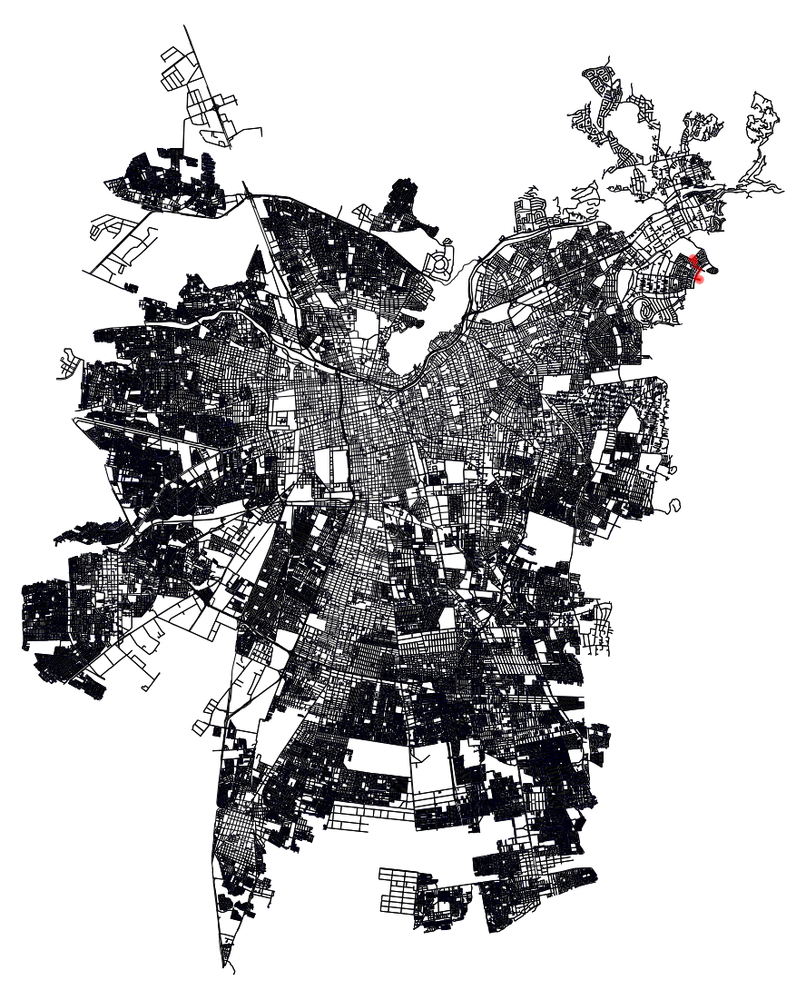

In [87]:
fig, ax = ox.plot_graph_route(vialidades_urbanas, route, node_size = 0.1, figsize=(20,20), bgcolor = 'w', node_color = 'blue', edge_color = 'black')

En lo siguiente aprovecharemos de agregar a nuestro GeoDataFrame de arcos el tiempo que se demora en recorrer este arco según las velocidades entregadas por osmnx.

Agrupemos todo lo anterior en una sola función que obtenga la ruta entre dos nodos. 

In [88]:
from itertools import product

a = [1, 2]
b = [13, 12]
c = list(product(a, b))

c

[(1, 13), (1, 12), (2, 13), (2, 12)]

La siguiente función `time_caminosmascortos` recibe dos zonas aledañas y calcula el tiempo promedio demorado en cruzar estas zonas. Para ello selecciona x nodos aleatorios de cada zona, calcula el tiempo total demorado entre un nodo a otro, siguiendo el camino más corto (**se supone que los conductores de Uber siguen la ruta más corta de un punto a otro [supuesto bastante realista]**). Esta función retorna el tiempo promedio entre cada una de las rutas posibles entre cada par de nodos origen (zona) y destino (vecina).

In [89]:
def time_caminosmascortos(nodos, zona, vecina, vialidades_urbanas, x):
  '''Recibe dos zonas aledañas, calcula el tiempo promedio demorado 
  en cruzar estas zonas.'''
  nodos0 = seleccion_nodos(zona, nodos, x)
  nodos9 = seleccion_nodos(vecina, nodos, x)
  combi = list(product(nodos0, nodos9))
  tiempo_total = 0
  for elem in combi:
    osmidA = elem[0]
    osmidB = elem[1]
    try:
      travel_time = nx.shortest_path_length(vialidades_urbanas, osmidA, osmidB, weight='travel_time')
    except:
      pass
    tiempo_total += round(travel_time)
  if len(combi) != 0:
    return tiempo_total/len(combi)
  else:
    return np.nan

In [90]:
time_caminosmascortos(nodos, 318, 301, vialidades_urbanas, 2)

109.5

In [91]:
type(np.nan)

float

#### 3. Obteniendo la Fracción Clave:

Con esta *fracción clave*, podremos más adelante obtener la velocidad que demora a una cierta hora del día. Lo que se hace en este paso es bastante simple.

Según el tiempo demorado desde una zona específica hacia su vecina en un cierto momento del día (obtenidos en la misión 1), podremos obtener las 4 fracciones claves, que multiplicarán las velocidades de OSMNX para obtener las velocidades en cada uno de esos 4 posibles horarios del día, según los tiempos promedio de viaje de UBER (de días de semana).

In [92]:
def fraccion_clave(nodos, zona, vecina, horario, zonas, tiempos, vialidades_urbanas, x):
  denominador = time_caminosmascortos(nodos, zona, vecina, vialidades_urbanas, x)
  #Para obtener denominador camino es un poco más largo.
  df = creator(zonas, tiempos, zona, horario)
  tablita = df['Tiempo desde Nodo: {}'.format(zona)].loc[paracolorear['ID'] == vecina]
  numerador = tablita.values[0]
  if denominador and numerador != np.nan:
    return (numerador / denominador)


In [93]:
fraccion_clave(nodos, 318, 301, 4, zonas, tiempos, vialidades_urbanas, 100)

5.795708154506437

In [94]:
fraccion_clave(nodos, 734, 735, 1, zonas, tiempos, vialidades_urbanas, 100)

nan

In [95]:
fraccion_clave(nodos, 674, 684, 1, zonas, tiempos, vialidades_urbanas, 10)

3.1733291996988355

#### 4. Cuociente Clave por Velocidades Arcos de todos los Shortest Path del par de zonas:

Para poder llevar la fracción clave a el GeoDataFrame compuesto por los arcos, debemos agarrar la velocidad de cada uno de los arcos que formaban parte de alguna de las rutas calculadas en el paso 2, y multiplicarla por nuestra fracción clave. Para ello es importante tener en cuenta que no podemos repetir el proceso de selección de nodos, sino multiplicaríamos nuestra fracción clave a arcos que no corresponden ser amplificados o disminuidos.

Crearemos una función `final` que permita hacer este proceso y modificar el GeoDataFrame de los arcos, con las nuevas velocidades según los tiempos calculador por Uber. Para ser consistente con la teoría propuesta, no usaremos las mismas funciones creadas en los pasos anteriores, pero si la estructura será exactamente la misma.

Esta función `final` recibe una zona, una zona aledaña o vecina, un valor de x (número de nodos a 

In [110]:
def final(nodos, zona, vecina, horario, zonas, tiempos, vialidades_urbanas, x, arcos):
  
  #Selecciono Nodos.
  nodos0 = seleccion_nodos(zona, nodos, x)
  nodos9 = seleccion_nodos(vecina, nodos, x)
  
  #Obtengo todas las posibles combinaciones entre ambos grupos de nodos.
  combi = list(product(nodos0, nodos9))
  tiempo_total = 0
  #Listado de los nodos origen destino que agrupan los arcos.
  rutas = []
  
  for elem in combi:
    osmidA = elem[0]
    osmidB = elem[1]
    try:
      route = nx.shortest_path(vialidades_urbanas, osmidA, osmidB, weight = 'travel_time')
      rutas.append(route)
    except:
      pass
    try:
      travel_time = nx.shortest_path_length(vialidades_urbanas, osmidA, osmidB, weight='travel_time')
      tiempo_total += round(travel_time)
    except:
      tiempo_total = np.nan
  
  if len(combi) != 0:
    denominador = tiempo_total/len(combi)
  else:
    denominador = np.nan
  
  #Obtengo denominador para frac_clave
  df = creator(zonas, tiempos, zona, horario)
  tablita = df['Tiempo desde Nodo: {}'.format(zona)].loc[paracolorear['ID'] == vecina]
  numerador = tablita.values[0]
  if denominador and numerador != np.nan:
    frac_clave = (numerador / denominador)
    
  #Multiplico uno por uno los arcos a modificar velocidad.  
  for camino in rutas:
    dfarcos = arcos.copy()    
    for i in range(len(camino)-1):
      alejito = dfarcos.loc[((dfarcos['v'] == camino[i]) & (dfarcos['u'] == camino[i+1])), 'speed_kph']
      try:
        indice = alejito.index[0]
        dfarcos.at[indice, 'speed_kph'] *= frac_clave
        return dfarcos
      except:
        dfarcos = arcos.copy()
        return dfarcos
  

In [111]:
arcosZ = final(nodos, 318, 301, 4, zonas, tiempos, vialidades_urbanas, 2, arcos)

Revisemos si la velocidad cambió (ya revisé que cambiaba según fracción clave). Efectivamente la velocidad cambió de manera correcta. Si bien, esta no es muy realista, no pretendía con mi algoritmo hacer una representación idéntica a la realidad. 

Creo sin embargo, que el algoritmo con un x lo suficientemente grande, puede converger asintóticamente al óptimo (si no me equivoco).

In [112]:
arcos.loc[((arcos['v'] == 6214163543) & (arcos['u'] == 250439348))]


,osmid,oneway,name,highway,length,speed_kph,travel_tim,from,to,lanes,maxspeed,access,bridge,tunnel,ref,junction,width,service,landuse,u,v,key,geometry
5965,23673207,1,Camino Las Flores,residential,174.02,40.3,15.55,6214163543,250439348,None,None,None,None,None,None,None,None,None,None,250439348,6214163543,0,"LINESTRING (-70.50409 -33.39637, -70.50508 -33..."


In [113]:
arcosZ.loc[((arcosZ['v'] == 6214163543) & (arcosZ['u'] == 250439348))]

,osmid,oneway,name,highway,length,speed_kph,travel_tim,from,to,lanes,maxspeed,access,bridge,tunnel,ref,junction,width,service,landuse,u,v,key,geometry
5965,23673207,1,Camino Las Flores,residential,174.02,220.626162,15.55,6214163543,250439348,None,None,None,None,None,None,None,None,None,None,250439348,6214163543,0,"LINESTRING (-70.50409 -33.39637, -70.50508 -33..."


#### 5. Aplicando a todo el GeoDataFrame de Arcos nuestro algoritmo.

Para ello se deben recorrer todas las zonas, y cada uno de sus vecinos. Si el arco que se está recorriendo ya se le modificó la velocidad, esta se modificará nuevamente. Pese a que se puede arreglar facilmente esto, se prefirió dejar así para que la intuición del algoritmo usado no sea más enredado todavía (pero basta con crear una columna en `arcos` que tome el valor de 1 si fue modificada o 0 si no, si el arco ya fue modificado [tiene en la nueva columna valor 1] no hay que modificarlo nuevamente. 

Utilizamos solo dos nodos seleccionados aleatoriamente (**x** = 2) dado que si no el computador tomará mucho tiempo en hacer lo pedido. Lo ideal es utilizar un **x** lo más grande posible.

En este proceso de ir añadiendo las velocidades a los arcos, hay que tener presente que debemos ir actualizando nuestra base de datos constantemente.

In [114]:
cosa = zonas.loc[zonas["ID"] == 1, 'vecinos'].values
cosa[0][4]

575

In [115]:
def velocidad(x, nodos, zonas, tiempos, vialidades_urbanas, ids, arcos, horario):
  df = arcos.copy()
  for id in ids:
    vecinos = zonas.loc[zonas["ID"] == id, 'vecinos'].values
    vecinos2 = vecinos[0]
    for vecino in vecinos2:
      df = final(nodos, id, vecino, horario, zonas, tiempos, vialidades_urbanas, x, arcos)
  return df

In [116]:
arcos_final_horario1 = velocidad(2, nodos, zonas, tiempos, vialidades_urbanas, ids, arcos, 1)

In [ ]:
arcos_final_horario2 = velocidad(2, nodos, zonas, tiempos, vialidades_urbanas, ids, arcos, 2)

In [ ]:
arcos_final_horario3 = velocidad(2, nodos, zonas, tiempos, vialidades_urbanas, ids, arcos, 3)

In [ ]:
arcos_final_horario4 = velocidad(2, nodos, zonas, tiempos, vialidades_urbanas, ids, arcos, 4)

Lamentablemente, no fui capaz de modificar el GeoDataFrame completo. Muchas excepciones se levantaron a medida que trataba de aplicar mi lógica. Estas se daban por la generación de nodos aleatorios de dos zonas, que no podían ser conectados entre sí. También tuve un problema que no se por qué al convertir el MultiDiGraph de `vialidades_urbanas` a un GeoDataFrame, algunos arcos no fueron incluidos en el GeoDataFrame, por lo que al buscar la información de los arcos que conectaban los nodos entregados por el algoritmo de `shortest_path`, me respondía que estos arcos no existían. Estos  problemas y miles de otros que me topaba en esta larga (pero ultra bonita) travesía, significaron mucho tiempo (bien invertido, pero en fin) que por ser fin de semestre no pude resolver antes de la entrega. Si bien, partí desarrollando este lab con mucha anticipación, lamento no haber podido llegar a la solución final, pero espero que al menos reciba un puntito por este camino tan tortuoso que implicó este desarrollo del cual estoy MUY pero MUY orgulloso. Muchas gracias!

#### Visualización:

Sin embargo, para no quedarme con las manos vacías para la visualización, hice una visualización con las velocidades entregadas por osmnx, cuando uno llama el método `add_edge_speed`.

Para desarrollar esta visualización quise agrupar las zonas por velocidad promedio, y así imprimir las zonas más veloces y las más lentas. Para ello fue necesario asignar a cada uno de los arcos de nuestro GeoDF `arcos`, su zona correspondiente. Para ello se utilizó como criterio que si el nodo donde parte el arco (**from** o **v**), esta ubicado en una zona **z**, entonces el arco pertenece a la zona **z**.

Para lograr esto se usará algo del estilo apply que agarre el osmid del nodo donde parte el arco, y rellene la nueva columna de `arcos` con la zona que le corresponde a ese mismo nodo. La lógica utilizada es similar a la que usé para asignar a cada nodo una zona, solo que ahora no se utiliza ningún for.


Cremos un data frame, que solo tenga los datos de `osmid` y `zonas` de el GeoDF de `nodos`.

In [167]:
dfnodoszona = nodos[['osmid','zonas']]
dfnodoszona.head()

,osmid,zonas
0,386138,48.0
1,386139,48.0
2,386140,20.0
3,386145,20.0
4,386157,13.0


Creamos una función que para cada valor de `from` de un arco que reciba, entregue el valor que le corresponde de zona.

In [178]:
def encontrar_zona2(arco, dfzonas = dfnodoszona):
  return dfzonas.loc[dfzonas['osmid'] == arco, 'zonas'].values[0]

In [179]:
encontrar_zona2(arcos.loc[0, 'from'])

48.0

Aplicamos nuestra función que funciona bien, como se puede ver en el cuadro anterior y en la visualización de `arcos``
 modificado.

In [180]:
arcos['zonas'] = arcos['from'].apply(lambda x: encontrar_zona2(x))

In [181]:
arcos.head()

,osmid,oneway,name,highway,length,speed_kph,travel_tim,from,to,lanes,maxspeed,access,bridge,tunnel,ref,junction,width,service,landuse,u,v,key,geometry,zonas
0,121815664,1,Enrique Mac Iver,primary,16.056,52.7,1.10,386138,14805063,None,None,None,None,None,None,None,None,None,None,386138,14805063,0,"LINESTRING (-70.64625 -33.44290, -70.64628 -33...",48.0
1,121815695,1,Avenida Libertador Bernardo O'Higgins,primary,45.325,52.7,3.10,386138,500862146,4,None,None,None,None,None,None,None,None,None,386138,500862146,0,"LINESTRING (-70.64625 -33.44290, -70.64578 -33...",48.0
2,223300795,1,Avenida Libertador Bernardo O'Higgins,primary,100.015,52.7,6.83,386139,386138,4,None,None,None,None,None,None,None,None,None,386138,386139,0,"LINESTRING (-70.64729 -33.44314, -70.64625 -33...",48.0
3,"[679088106, 679088092]",1,Avenida Santa Rosa,primary,134.137,50.0,9.66,224458225,386138,4,50,None,None,None,None,None,None,None,None,386138,224458225,0,"LINESTRING (-70.64592 -33.44407, -70.64600 -33...",34.0
4,23321898,1,San Francisco,secondary,267.227,50.7,18.97,386139,14805040,2,None,None,None,None,None,None,None,None,None,386139,14805040,0,"LINESTRING (-70.64729 -33.44314, -70.64715 -33...",48.0


Ahora agrupamos por zona según la media de la velocidad de cada uno de sus arcos, usando el método `group_by` de la librería pandas.

In [198]:
paravisualizar = arcos.groupby(['zonas']).mean()
paravisualizar2 = paravisualizar['speed_kph']
paravisualizar2.head()

zonas
1.0    42.360317
2.0    45.314035
3.0    44.798551
4.0    43.200000
5.0    43.882895
Name: speed_kph, dtype: float64

Con lo anterior, obtenemos la media de cada una de las columnas numéricas de nuestro GeoDF `arcos`, agrupados por el valor de zona. De este nuevo GeoDF solo nos interesa la columna `speed_kph`, la velocidad promedio por zona.

Agregamos esa columna a nuestro GeoDF de `zonas`. Pero para no tener enredos, creamos un `zonas3` que contenga esta nueva variable. Es necesario hacer esto porque para visualizar es solo un DF, no un GeoDF.

Para ello hacemos algo parecido a lo que hicimos para agregar a cada arco una zona en específico.

In [188]:
zonas3 = zonas.set_index("ID")

In [189]:
zonas3.head()

,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry,vecinos
ID,,,,,,,
318,13114,Las Condes,0,1,ID 318,"POLYGON ((-70.50243 -33.41327, -70.50160 -33.4...","[301, 302]"
311,13114,Las Condes,0,2,ID 311,"POLYGON ((-70.48181 -33.38163, -70.48239 -33.3...","[310, 327, 328]"
301,13114,Las Condes,0,3,ID 301,"POLYGON ((-70.50838 -33.38215, -70.50831 -33.3...","[302, 310, 316, 318]"
734,13301,Colina,0,4,ID 734,"POLYGON ((-70.69606 -33.23737, -70.69540 -33.2...","[728, 729, 733, 735, 736, 741]"
330,13115,Lo Barnechea,0,5,ID 330,"POLYGON ((-70.50891 -33.36313, -70.50852 -33.3...","[327, 328, 329, 331]"


In [196]:
listoco = pd.concat([zonas3, paravisualizar2], axis = 1)

In [197]:
listoco.head()

,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry,vecinos,speed_kph
1.0,13101,Santiago,1,366,ID 1,"POLYGON ((-70.66922 -33.43214, -70.67026 -33.4...","[2, 3, 8, 39, 575]",42.360317
2.0,13101,Santiago,2,364,ID 2,"POLYGON ((-70.67486 -33.43341, -70.67450 -33.4...","[1, 3, 4, 5, 39, 40, 557, 569]",45.314035
3.0,13101,Santiago,3,365,ID 3,"POLYGON ((-70.66906 -33.43382, -70.66895 -33.4...","[1, 2, 4, 5, 8, 9]",44.798551
4.0,13101,Santiago,4,357,ID 4,"POLYGON ((-70.67944 -33.44399, -70.67958 -33.4...","[2, 3, 5, 6, 7, 40, 125, 557]",43.200000
5.0,13101,Santiago,5,356,ID 5,"POLYGON ((-70.67306 -33.44327, -70.67396 -33.4...","[2, 3, 4, 6, 7, 9, 10, 11]",43.882895


<AxesSubplot:>

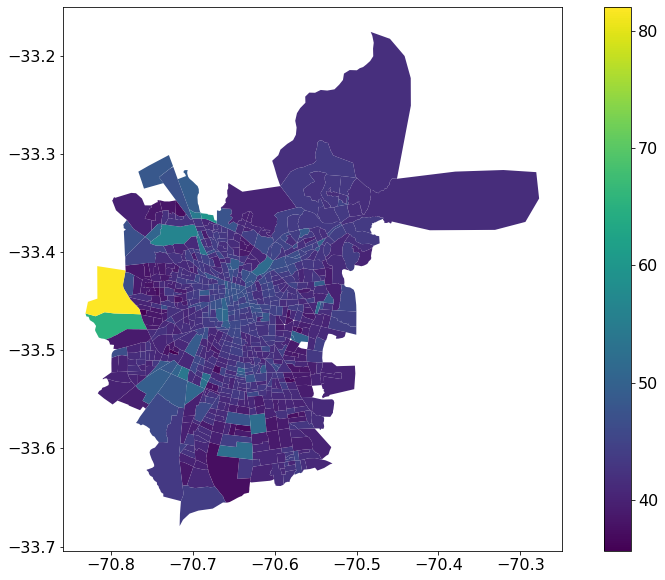

In [199]:
listoco.plot(column= 'speed_kph', legend = True)

Para tener mayor variedad de color, aplicamos log a la columna de `speed_kph` de el GeoDF `listoco`.

In [200]:
listoco['speed_kph'] = np.log(listoco['speed_kph'])

<AxesSubplot:>

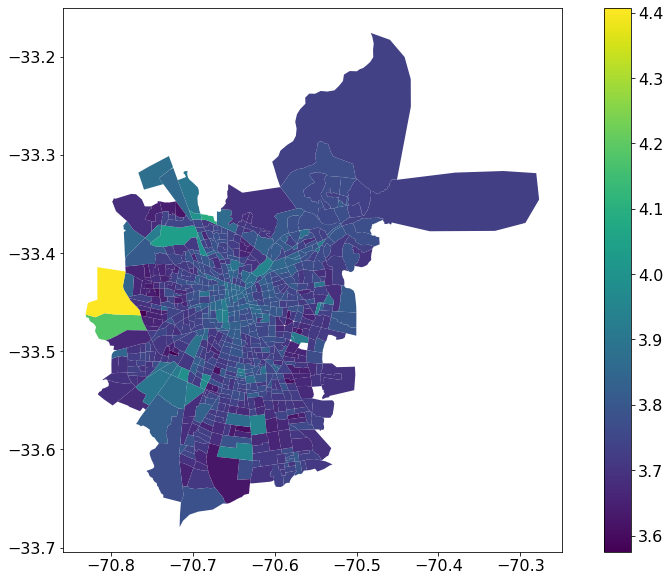

In [201]:
listoco.plot(column= 'speed_kph', legend = True)

Algo mejora la variedad de colores.

De haber tenido bien mi función `velocidad`, hubiese hecho este mismo proceso para cada una de los 4 GeoDF, del tipo `arcos_final_horario1`, `arcos_final_horario2`, `arcos_final_horario3`, `arcos_final_horario4`. Luego hubiese tenido las 4 visualizaciones pedidas. Para automatizar este proceso de manera más elegante, hubiese creado la función plotear, que agrupase cada uno de estos pasos, y así aplicar a cada uno de los 4 GeoDFs mencionados una sola función, y en una sola linea obtener el código pedido. La función `plotear` se encuentra en el siguiente cuadro:

In [204]:
def plotear(nodos, arcos_final_horarioH):
  dfnodoszona = nodos[['osmid','zonas']]
  arcos['zonas'] = arcos['from'].apply(lambda x: encontrar_zona2(x))
  paravisualizar = arcos.groupby(['zonas']).mean()
  paravisualizar2 = paravisualizar['speed_kph']
  zonas3 = zonas.set_index("ID")
  listoco = pd.concat([zonas3, paravisualizar2], axis = 1)
  listoco['speed_kph'] = np.log(listoco['speed_kph'])
  return listoco.plot(column= 'speed_kph', legend = True)

<AxesSubplot:>

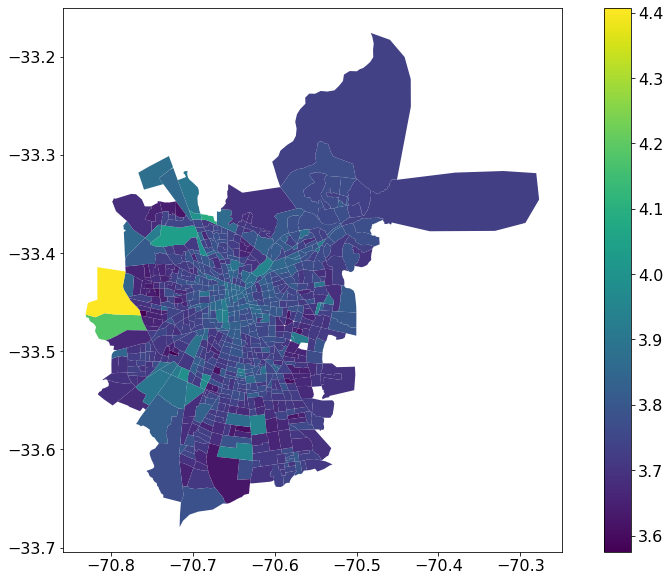

In [205]:
plotear(nodos, arcos)

Quizás lo que se buscaba con la visualización, era que por cada uno de los 4 horarios hacer una visualización de los arcos y sus velocidades respectivas, más que la velocidad promedio de los arcos de cada zona. Si esto último es cierto, hubiésemos tenido que correr para cada uno de los GeoDFs armados con la función `velocidad` (`arcos_final_horario1`, `arcos_final_horario2`, `arcos_final_horario3` y `arcos_final_horario4`) la siguiente línea de código.

<AxesSubplot:>

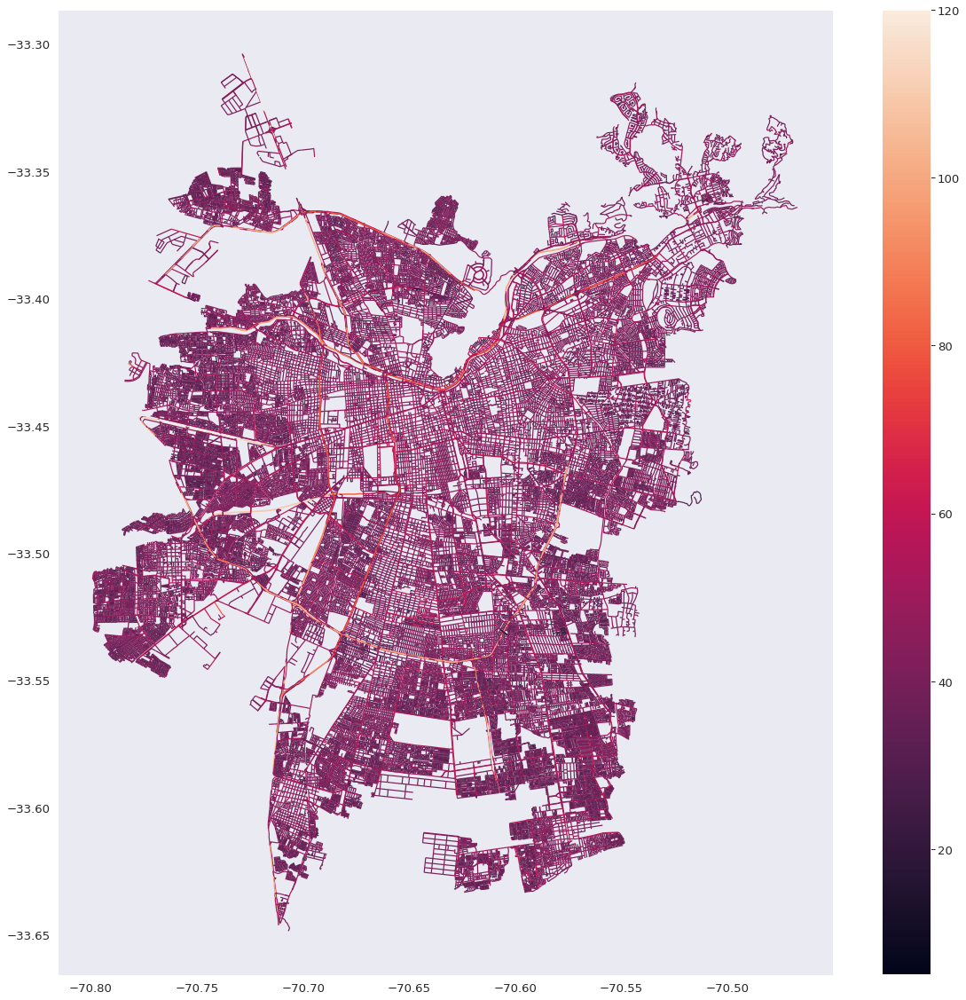

In [315]:
arcos.plot(column = 'speed_kph', figsize = (20,20), legend = True)

**IMPORTANTE**

Notamos que la velocidad de ciertas calles es bastante más alta, y alguna bastante baja. **Si tuviésemos la velocidad de cada horario, con la información de UBER, podríamos comparar hacernos una idea de cuanto demoran al trabajo (en los días de semana, por eso usamos solo esos tiempos de viaje) las personas según donde viven. Para ello debiéramos tener especial ojo con los horarios 2 y 4. Siendo estos últimos correspondientes a el horario de ida al trabajo y el de vuelta respectivamente.** 

Quizás podríamos tener más variedad de color si aplicásemos log a la columna `speed_kph`, veamos que pasa.

<AxesSubplot:>

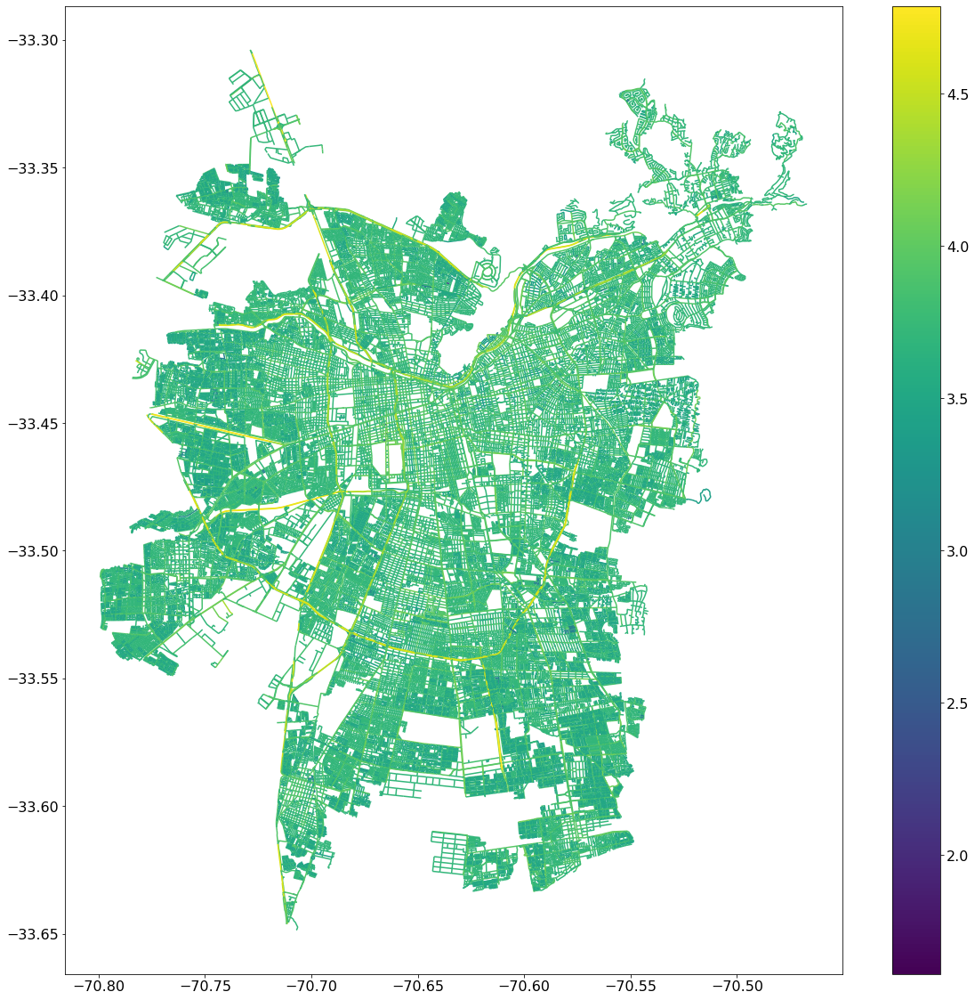

In [210]:
arcosV = arcos.copy()
arcosV['speed_kph'] = np.log(arcosV['speed_kph'])
arcosV.plot(column = 'speed_kph', figsize = (20,20), legend = True)

Notamos que no cambia mucho, pero igualmente es bonito de tenerlo en este informe, así que con esto cerramos la fallida Misión 2b.

## Misión 3: 

En esta misión deberá buscar por internet algún tipo de información que pueda añadir a sus datos (que sea geo-referenciable de alguna forma). Para completar esta misiión deberá hacer uso de web scrapping para obtener la información de internet. Ayúdese con el tutorial de expresiones regulares (disponible en el Syllabus) para procesar los datos obtenidos. Genere una visualización de la ciudad de Santiago que incluya esta característica. Es libre de generar la visualización de mapa que desee siempre y cuando incluya relación con la característica obtenida.

En la siguiente sección se extraerá información sobre los resultados en el Plebiscito Constitucional de Octubre del 2020. La página para extraer esta información es un famoso medio de comunicaciones deportivo, que hoy en día comunica todo tipo de noticias. El url específico a utilizar es el siguiente: https://chile.as.com/chile/2020/10/26/actualidad/1603716098_944619.html.

La idea es hacer con esto relaciones entre como fue el porcentaje de victoria del Apruebo en cada comuna, y luego relacionar esta variable con los tiempos de traslado (necesario para la misión 4). La verdad es que no se bien que esperar de la relación entre tiempos de viaje y resultado en el plebiscito, por eso mismo me parece interesante estudiar la relación entre ambas variables.

Siguiendo la línea de la materia de clases, debemos primero desargar el código fuente de la página.

Antes sin embargo, debemos instalar las siguientes librerías:

#### Instalación de Librerías:

In [131]:
!pip3 install pyrematch

#### Parte Web-Scrapping: 
Ahora seguimos con la extracción de los porcentajes de victoria del apruebo y el nombre de la respectiva comuna.

In [148]:
import urllib.request as net
import ssl

class WebDownloader:
    
    def __init__(self, link):
        self.user_agent = 'Mozilla/5.0 (Windows; U; Windows NT 5.1; en-US; rv:1.9.0.7) Gecko/2009021910 Firefox/3.0.7'
        self.url =  link
        
        
    def getHtmlAsString(self):
        headers = {'User-Agent':self.user_agent}
        request= net.Request(self.url,None,headers)
        gcontext = ssl.SSLContext()
        response = net.urlopen(request,context=gcontext)
        return response.read().decode('utf-8')
    
wd = WebDownloader('https://chile.as.com/chile/2020/10/26/actualidad/1603716098_944619.html')
sourceCode = wd.getHtmlAsString()
#print(sourceCode)

Notamos que los datos de los resultados se encuentran dentro de categorías del tipo `p` (saqué la impresión del `sourceCode`, para no ser latero). Por lo tanto, con el método de la librería `beautiful soup 4`, `find_all`, extraeremos todos los datos que estén dentro de este tipo de categoría. Además notamos que es necesario limpiar cada una de las observaciones que nos quedan en nuestra lista `info`, ya que siempre parten con una doble comillas y una *b*, y son cerradas con doble comillas al final. De esta forma, será más fácil luego filtrar la información que queremos usando la buenísima librería `pyrematch` vía la utilización de expresiones regulares.

In [149]:
import bs4
info = []
soup = bs4.BeautifulSoup(sourceCode)
for node in soup.findAll('p'):
    info.append(str(u''.join(node.findAll(text=True)).encode('utf-8'))[2:-1])

In [150]:
print(info)

['\\n\\nActualidad\\n ', '\\nACTUALIDAD ', 'Con una masiva participaci\\xc3\\xb3n de los chilenos, este domingo 25 de octubre se llev\\xc3\\xb3 a cabo el Plebiscito Nacional 2020 en torno a la consulta sobre redactar una nueva constituci\\xc3\\xb3n para el pa\\xc3\\xads. El 50,86 por ciento del padr\\xc3\\xb3n electoral (cerca de 7,5 millones de personas) asisti\\xc3\\xb3 a las lugares de votaci\\xc3\\xb3n y la opci\\xc3\\xb3n Apruebo result\\xc3\\xb3 ampliamente vencedora con el 78,26 por ciento de los sufragios en detrimento de la alternativa Rechazo, que obtuvo solamente el 21,73 por ciento de las preferencias ciudadanas.', 'En cuanto al organismo que elaborar\\xc3\\xa1 la nueva carta marga, la opci\\xc3\\xb3n Convenci\\xc3\\xb3n Constitucional, que estar\\xc3\\xa1 integrada por 155 ciudadanos solo para cumplir ese fin, result\\xc3\\xb3 tambi\\xc3\\xa9n ampliamente vencedora con el 78, 99 por ciento de las preferencias de los votantes. La alternativa Convenci\\xc3\\xb3n Mixta Consti

Al igual que para la actividad práctica 05, se utilizó constantemente la página web: www.regex101.com sugerida por Pablo en la última ayudantía del curso.

A través de esta página, no se hizo tan latero el proceso para filtrar los datos que quería extraer. En particular estos son los datos del nombre de la comuna y los datos del porcentaje de victoria del apruebo.

Partamos extrayendo el porcentaje de victoria del apruebo.

In [151]:
import pyrematch as re

In [152]:
seq = info
pattern = "(Apruebo: )!porcentaje{.....}(%)"
regex = re.compile(pattern)

apruebo  = []
for s in seq:
  for match in regex.finditer(s):
    apruebo.append(match.group('porcentaje'))

In [153]:
print(apruebo)

['79,81', '64,19', '76,18', '82,62', '84,11', '44,25', '38,37', '33,05', '81,27', '84,19', '86,15', '85,23', '88,22', '84,22', '81,35', '87,07', '87,89', '81,73', '86,18', '84,65', '88,87', '85,01', '87,75', '83,93', '87,74', '85,36', '81,46']


Aprovechamos de convertir a número cada uno de estos porcentajes.

In [221]:
aprue = []
for porcentaje in apruebo:
  porcentaje = porcentaje.replace(',','.')
  aprue.append(float(porcentaje))

print(aprue)
apruebo = aprue

[79.81, 64.19, 76.18, 82.62, 84.11, 44.25, 38.37, 33.05, 81.27, 84.19, 86.15, 85.23, 88.22, 84.22, 81.35, 87.07, 87.89, 81.73, 86.18, 84.65, 88.87, 85.01, 87.75, 83.93, 87.74, 85.36, 81.46]


Ahora procedamos a extraer el nombre de cada una de las comunas. Se pensó utilizar un pattern como el siguiente:

`pattern = "^[a-zA-ZÑñ\s]*$"`

Pero no resultó, dado que teníamos algunos elementos de la lista `info`, que cumplían este criterio. El problema fue entonces que no tenemos un criterio único para filtrar las comunas. Por ello se limpió inicialmente nuestra lista `info` de los primeros 6 elementos de la lista y de los últimos 4 elementos. 

In [228]:
info2 = info[6:-4]
print(info2)

['Santiago', 'Apruebo: 79,81%\\nRechazo: 20,18%', 'Convenci\\xc3\\xb3n Mixta Constitucional: 18,32%\\nConvenci\\xc3\\xb3n Constitucional: 81,68%', 'Providencia', 'Apruebo: 64,19%\\nRechazo: 35,81%', 'Convenci\\xc3\\xb3n Mixta Constitucional: 31,91%\\nConvenci\\xc3\\xb3n Constitucional: 68,09%', '\\xc3\\x91u\\xc3\\xb1oa', 'Apruebo: 76,18%\\nRechazo: 23,82%', 'Convenci\\xc3\\xb3n Mixta Constitucional: 21,96%\\nConvenci\\xc3\\xb3n Constitucional: 78,05%', 'Macul', 'Apruebo: 82,62%\\nRechazo:17,38%', 'Convenci\\xc3\\xb3n Mixta Constitucional: 17,04%\\nConvenci\\xc3\\xb3n Constitucional: 82,96%', 'Pe\\xc3\\xb1alol\\xc3\\xa9n', 'Apruebo: 84,11%\\nRechazo: 15,89%', 'Convenci\\xc3\\xb3n Mixta Constitucional: 17,02%\\nConvenci\\xc3\\xb3n Constitucional: 82,98%', 'Las Condes', 'Apruebo: 44,25%\\nRechazo: 55,75%', 'Convenci\\xc3\\xb3n Mixta Constitucional: 51,47%\\nConvenci\\xc3\\xb3n Constitucional: 48,53%', 'Lo Barnechea', 'Apruebo: 38,37%\\nRechazo: 61,63%', 'Convenci\\xc3\\xb3n Mixta Constitu

Sin embargo, luego usamos un pattern que nos aseguraba de extraer todas las comunas, sin importar que estas tuviesen ñ o no y sin importar que tuviesen tilde o no. Curiosamente no funcionó bien el encoding, quizás no funciona bien a la hora de hacer prints, pero no logré pillar en ningún lado por qué ocurría, este *mal funcionamiento*.

El pattern utilizado, fue uno que permitía seleccionar todas las observaciones de nuestra lista info que no tuviesen %. El pattern es:

`pattern = "(%)"`

De esta forma, obtuvimos un set llamado `nocomunas` que tenía todas las observaciones de `info2` que no correspondían a comunas (basicamente contenía los NO múltiplos de 3).

In [229]:
seq2 = info2
pattern = "(%)"
regex = re.compile(pattern)

nocomunas = set()
for i in range(len(seq2)):
    if regex.find(seq2[i]):
      nocomunas.add(i)

In [230]:
print(nocomunas)

{1, 2, 4, 5, 7, 8, 10, 11, 13, 14, 16, 17, 19, 20, 22, 23, 25, 26, 28, 29, 31, 32, 34, 35, 37, 38, 40, 41, 43, 44, 46, 47, 49, 50, 52, 53, 55, 56, 58, 59, 61, 62, 64, 65, 67, 68, 70, 71, 73, 74, 76, 77, 79, 80}


Extraemos las columnas usando nuestro set de `nocolumnas`:

In [231]:
comunas = []
for i in range(len(seq2)):
  if i not in nocomunas:
    comunas.append(seq2[i])

Podemos ver ahora nuestras comunas:

In [232]:
print(comunas)

['Santiago', 'Providencia', '\\xc3\\x91u\\xc3\\xb1oa', 'Macul', 'Pe\\xc3\\xb1alol\\xc3\\xa9n', 'Las Condes', 'Lo Barnechea', 'Vitacura', 'Huechuraba', 'Estaci\\xc3\\xb3n Central', 'Maip\\xc3\\xba', 'San Bernardo', 'Puente Alto', 'La Florida', 'San Miguel', 'San Joaqu\\xc3\\xadn', 'Quilicura', 'Independencia', 'Conchal\\xc3\\xad', 'Recoleta', 'Renca', 'Quinta Normal', 'Pudahuel', 'Cerrillos', 'Cerro Navia', 'El Bosque', 'La Cisterna']


Sin embargo, notamos que como el decoding a `utf-8` no funcionó (usé los códigos de clase... fome que no haya funcionado, busqué mucho rato en Google y no pillé solución), cambiaremos a mano los nombres de las comunas que están mal escritas, de manera tal de simplificar la futura georreferenciación con nuestro GeoDataFrame de Arcos.

In [233]:
comunas[2] = 'Ñuñoa'
comunas[4] = 'Peñalolen'
comunas[9] = 'Estación Central'
comunas[10] = 'Maipú'
comunas[15] = 'San Joaquín'
comunas[18] = 'Conchalí'

Notamos que ahora tenemos las comunas bien escritas en nuestra lista ordenada de comunas.

In [234]:
print(comunas)

['Santiago', 'Providencia', 'Ñuñoa', 'Macul', 'Peñalolen', 'Las Condes', 'Lo Barnechea', 'Vitacura', 'Huechuraba', 'Estación Central', 'Maipú', 'San Bernardo', 'Puente Alto', 'La Florida', 'San Miguel', 'San Joaquín', 'Quilicura', 'Independencia', 'Conchalí', 'Recoleta', 'Renca', 'Quinta Normal', 'Pudahuel', 'Cerrillos', 'Cerro Navia', 'El Bosque', 'La Cisterna']


Para luego hacer más simple el traslape de estos datos a mi GeoDataFrame de Arcos, crearé un diccionario que contenga esta información.

In [235]:
dicapruebo = dict()
for i in range(len(comunas)):
  dicapruebo[comunas[i]] = apruebo[i]
  

#### Llevando información *Scrapeada* a `zonas`.

Ahora siguiendo pasos parecidos a los que se han usado previamente, procedemos a asignar a cada zona según la comuna que pertenezca, el porcentaje de votación de la opción `Apruebo`. Se asigna esta información a zonas y no a otro GeoDF, dado que como los datos son por comuna, es lo que tiene más sentido.

Creamos entonces una función que reciba la comuna de una zona y que entregue de vuelta el porcentaje de votación por la opción apruebo que hubo en esa zona. Si la comuna no tiene información del porcentaje de votación de la opción apruebo, entonces se rellena con la media.

In [236]:
def encontrar_apruebo(comuna_zona, diccionario = dicapruebo):
  try:
    return diccionario[comuna_zona]
  except:
    return np.mean(apruebo)



In [237]:
zonas['apruebo'] = zonas['Comuna'].apply(lambda x: encontrar_apruebo(x))


In [238]:
zonas.head()

,ID,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry,vecinos,apruebo
0,318,13114,Las Condes,0,1,ID 318,"POLYGON ((-70.50243 -33.41327, -70.50160 -33.4...","[301, 302]",44.25
1,311,13114,Las Condes,0,2,ID 311,"POLYGON ((-70.48181 -33.38163, -70.48239 -33.3...","[310, 327, 328]",44.25
2,301,13114,Las Condes,0,3,ID 301,"POLYGON ((-70.50838 -33.38215, -70.50831 -33.3...","[302, 310, 316, 318]",44.25
3,734,13301,Colina,0,4,ID 734,"POLYGON ((-70.69606 -33.23737, -70.69540 -33.2...","[728, 729, 733, 735, 736, 741]",78.55
4,330,13115,Lo Barnechea,0,5,ID 330,"POLYGON ((-70.50891 -33.36313, -70.50852 -33.3...","[327, 328, 329, 331]",38.37


Notamos que efectivamente se agregó de manera correcta la columna apruebo con los porcentajes respectivos de cada zona.

<Figure size 720x720 with 0 Axes>

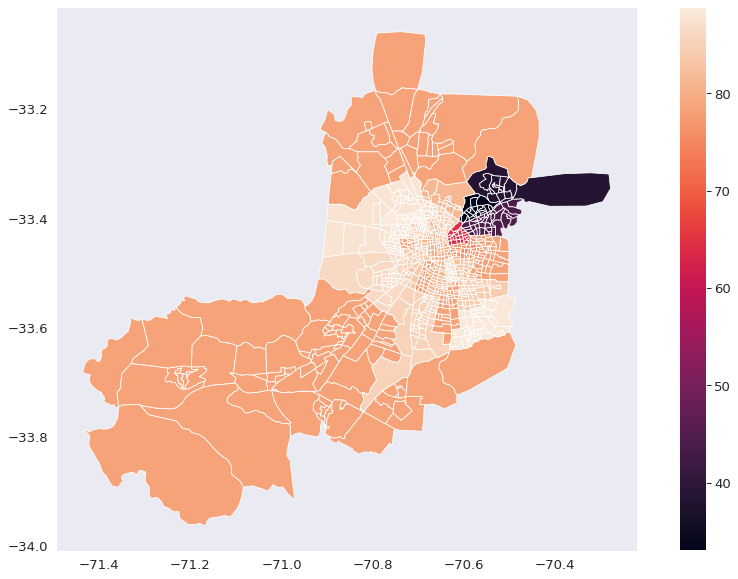

In [253]:
plt.figure(figsize = (10,10))
zonas.plot(column = 'apruebo', legend = True)
plt.show()

Es impactante ver como se distribuyen los votos en Santiago. Mucho se ha dicho al respecto en los últimos días. No es el objetivo de este estudio juvenil, hacer comentarios pero es importante que como chilenos reflexionemos al respecto

Apliquemos log a la columna apruebo, haber si logramos tener menos cambios bruscos de color.

In [243]:
import seaborn as sns

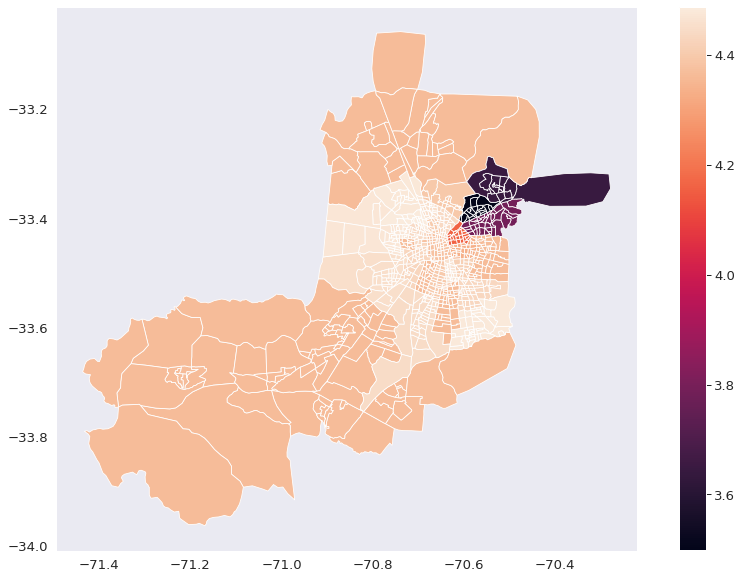

In [254]:
zonasC = zonas.copy()
zonasC['apruebo'] = np.log(zonas['apruebo'])
zonasC.plot(column = 'apruebo', legend = True)
plt.show()

Algo cambia, pero aún se puede ver la gran diferencia de votación entre los distintos sectores de Santiago. Probablemente, la aplicación de log no ayuda mucho, ya que la diferencia entre los porcentajes de votación fue abismal.

## Misión 4: Indicadores en Transporte Público

En esta última misión deberá utilizar el Shape de los trazados de los servicios de Red (ex-Transantiago) y generar un ranking con ellos. El ranking debe ser realizado a en base a un indicador construido por usted. El único requisito en la construcción del indicador es que se utilice la información obtenida en las misiones M2 y M3. Debe pasar la información a los servicios y determinar el indicador en cada uno de ellos. Finalmente cree una visualización de mapa de este indicador para los servicios de Red.

Obtenemos primero entonces el shape de Red. Y lo visualizamos con el objetivo de familiarizarnos un poco con su contenido.

In [255]:
df_red = gpd.read_file('Trazados_red.shp')

In [256]:
df_red.head()

,ROUTE_ID,ROUTE_NAME,SERVICE_NA,UN,OP_NOC,DIST,DISTPAGO,PO_MOD,SENTIDO,COD_USUARI,COD_TS,COD_SINSER,COD_SINRUT,COD_USUSEN,TIPO_SERV,FREC_PM,FREC_PT,PLAZAS_PM,PLAZAS_PT,SEL_PM,SEL_PT,SEN1,VALIDA,geometry
0,1360,410yI,INYECCION,6,None,10.91343,0.0,Sin Modificacion,I,410,B80y,B80c2,B80 C2 00I,410I,3,0.0,0.0,0.0,0.0,0,0,1.0,1,"LINESTRING (341421.947 6302537.306, 341494.052..."
1,2754,120R,(M) LA CISTERNA - RENCA,6,None,21.73581,0.0,Sin Modificacion,R,120,B82,B82,B82 00R,120R,1,6.0,6.0,582.0,582.0,1,1,0.0,1,"LINESTRING (345529.621 6287846.142, 345539.930..."
2,2762,120I,RENCA - (M) LA CISTERNA,6,None,21.98103,0.0,Sin Modificacion,I,120,B82,B82,B82 00I,120I,1,6.0,6.0,582.0,582.0,1,1,0.0,1,"LINESTRING (339076.241 6302675.821, 339087.773..."
3,5320,119R,LO ESPEJO - MAPOCHO,3,None,18.82501,0.0,Sin Modificacion,R,119,319,T319,T319 00R,119R,1,12.0,7.0,1241.0,735.0,1,1,0.0,1,"LINESTRING (341995.228 6287858.102, 342253.451..."
4,5322,119I,MAPOCHO - LO ESPEJO,3,None,19.49691,0.0,Sin Modificacion,I,119,319,T319,T319 00I,119I,1,8.0,10.0,849.0,1029.0,1,1,0.0,1,"LINESTRING (346795.429 6299443.996, 346782.523..."


Luego de la visualización notamos que tiene diversas columnas, podemos notar rápidamente que las coordenadas no soon del tipo `lat-long`. 

Veamos como se ve en el mapa. 

<AxesSubplot:>

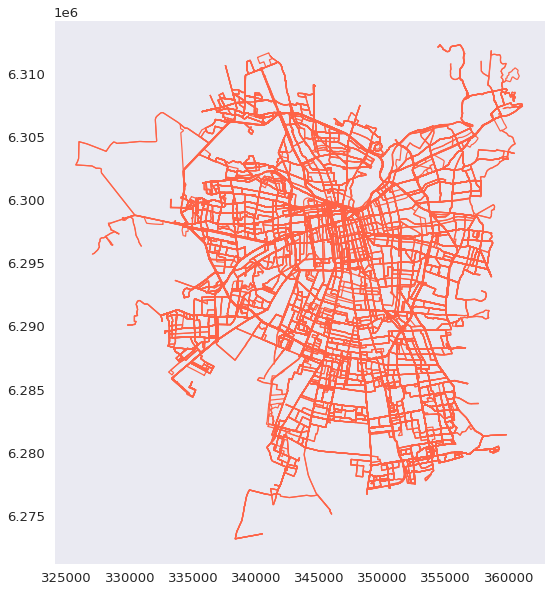

In [264]:
df_red.plot(color = "tomato")

Chequiemos rápidamente cual es el código EPSG de esta archivo .shp:

In [260]:
df_red.crs

<Projected CRS: EPSG:32719>
Name: WGS 84 / UTM zone 19S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 72°W and 66°W, southern hemisphere between 80°S and equator, onshore and offshore. Argentina. Bolivia. Brazil. Chile. Colombia. Peru.
- bounds: (-72.0, -80.0, -66.0, 0.0)
Coordinate Operation:
- name: UTM zone 19S
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

El archivo tiene un código EPSG de 32719, como pudimos notar al ver el head de este nuevo GeoDF creado, la georreferenciación se hizo con otro código al que habíamos utilizado en las demás georreferenciaciones utilizadas (EPSG: 4326). Convertimos entonces la georreferenciación a una del tipo 4326, mediante el siguiente código:

In [265]:
red = df_red.to_crs(4326)

Revisamos que se haya realizado nuestro objetivo:

In [267]:
red.head()

,ROUTE_ID,ROUTE_NAME,SERVICE_NA,UN,OP_NOC,DIST,DISTPAGO,PO_MOD,SENTIDO,COD_USUARI,COD_TS,COD_SINSER,COD_SINRUT,COD_USUSEN,TIPO_SERV,FREC_PM,FREC_PT,PLAZAS_PM,PLAZAS_PT,SEL_PM,SEL_PT,SEN1,VALIDA,geometry
0,1360,410yI,INYECCION,6,None,10.91343,0.0,Sin Modificacion,I,410,B80y,B80c2,B80 C2 00I,410I,3,0.0,0.0,0.0,0.0,0,0,1.0,1,"LINESTRING (-70.70528 -33.40479, -70.70451 -33..."
1,2754,120R,(M) LA CISTERNA - RENCA,6,None,21.73581,0.0,Sin Modificacion,R,120,B82,B82,B82 00R,120R,1,6.0,6.0,582.0,582.0,1,1,0.0,1,"LINESTRING (-70.66365 -33.53784, -70.66354 -33..."
2,2762,120I,RENCA - (M) LA CISTERNA,6,None,21.98103,0.0,Sin Modificacion,I,120,B82,B82,B82 00I,120I,1,6.0,6.0,582.0,582.0,1,1,0.0,1,"LINESTRING (-70.73047 -33.40319, -70.73035 -33..."
3,5320,119R,LO ESPEJO - MAPOCHO,3,None,18.82501,0.0,Sin Modificacion,R,119,319,T319,T319 00R,119R,1,12.0,7.0,1241.0,735.0,1,1,0.0,1,"LINESTRING (-70.70170 -33.53722, -70.69886 -33..."
4,5322,119I,MAPOCHO - LO ESPEJO,3,None,19.49691,0.0,Sin Modificacion,I,119,319,T319,T319 00I,119I,1,8.0,10.0,849.0,1029.0,1,1,0.0,1,"LINESTRING (-70.64804 -33.43346, -70.64818 -33..."


En lo que viene se hará lo siguiente:

Tenemos distintos recorridos (linestrings) que pasan por las distintas zonas y comunas de Santiago. En cada una de estas zonas sabemos cual es el porcentaje de votación de apruebo y también sabemos cual es la velocidad promedio de las calles de esa zona (no para los 4 horarios porque nos falló la función `velocidad`). 

Para cada zona elaboraremos el índice: **`ganas_de_cambio`**. Se cree que una persona que vive en una zona con velocidad promedio menor tiene más ganas de que cambien las cosas. Además, el hecho de que haya votado apruebo nos señala que esa persona tiene grandes ganas de que cambien las cosas también. Dado este razonamiento, el índice **ganas_de_cambio** se compondrá de la siguiente manera:

`ganas de cambio` = `apruebo` / `velocidad`

Este índice captura las ganas de que cambien las cosas que se vive o se tiene en cada zona. Dicho eso, después de obtener el valor de nuestro índice para cada zona, procederemos a asignarlos a los trazados de Red de la siguiente forma:

Se verá cada una de las zonas por las cuales atraviesa cada uno de los trazados de Red. Para cada uno de estos trazados, obtendremos el promedio de nuestro índice `ganas_de_cambio` entre todas las zonas por las cuales pase el trazado.

Teniendo este último valor promedio, hacemos el ranking pedido.

Partamos:


Debemos inicialmente obtener nuestro índice `ganas_de_cambio` para cada una de las zonas. Para ello *reciclaremos* la tabla `listoco` que contiene como índice el ID de cada zona y la velocidad promedio de los arcos de cada zona (solo para un horario, dado que nuestra función `velocidad` no funcionó).

In [268]:
listoco.head()

,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry,vecinos,speed_kph
1.0,13101,Santiago,1,366,ID 1,"POLYGON ((-70.66922 -33.43214, -70.67026 -33.4...","[2, 3, 8, 39, 575]",3.746212
2.0,13101,Santiago,2,364,ID 2,"POLYGON ((-70.67486 -33.43341, -70.67450 -33.4...","[1, 3, 4, 5, 39, 40, 557, 569]",3.813617
3.0,13101,Santiago,3,365,ID 3,"POLYGON ((-70.66906 -33.43382, -70.66895 -33.4...","[1, 2, 4, 5, 8, 9]",3.802176
4.0,13101,Santiago,4,357,ID 4,"POLYGON ((-70.67944 -33.44399, -70.67958 -33.4...","[2, 3, 5, 6, 7, 40, 125, 557]",3.765840
5.0,13101,Santiago,5,356,ID 5,"POLYGON ((-70.67306 -33.44327, -70.67396 -33.4...","[2, 3, 4, 6, 7, 9, 10, 11]",3.781525


Ahora agregamos a `listoco`, el porcentaje de personas de la comuna a la cual pertenece que votó apruebo.

In [269]:
listoco["apruebo"] = listoco['Comuna'].apply(lambda x: encontrar_apruebo(x))

In [270]:
listoco.head()

,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry,vecinos,speed_kph,apruebo
1.0,13101,Santiago,1,366,ID 1,"POLYGON ((-70.66922 -33.43214, -70.67026 -33.4...","[2, 3, 8, 39, 575]",3.746212,79.81
2.0,13101,Santiago,2,364,ID 2,"POLYGON ((-70.67486 -33.43341, -70.67450 -33.4...","[1, 3, 4, 5, 39, 40, 557, 569]",3.813617,79.81
3.0,13101,Santiago,3,365,ID 3,"POLYGON ((-70.66906 -33.43382, -70.66895 -33.4...","[1, 2, 4, 5, 8, 9]",3.802176,79.81
4.0,13101,Santiago,4,357,ID 4,"POLYGON ((-70.67944 -33.44399, -70.67958 -33.4...","[2, 3, 5, 6, 7, 40, 125, 557]",3.765840,79.81
5.0,13101,Santiago,5,356,ID 5,"POLYGON ((-70.67306 -33.44327, -70.67396 -33.4...","[2, 3, 4, 6, 7, 9, 10, 11]",3.781525,79.81


Teniendo listo nuestro GeoDF, podemos calcular ahora nuestro índice:
`g_d_c` (corresponde al abreviativo de ganas de cambio).

In [271]:
listoco['g_d_c'] = listoco['apruebo']/listoco['speed_kph']

Observamos que se haya cumplido según lo pensado.

In [272]:
listoco.head()

,Com,Comuna,Zona,MOVEMENT_ID,DISPLAY_NAME,geometry,vecinos,speed_kph,apruebo,g_d_c
1.0,13101,Santiago,1,366,ID 1,"POLYGON ((-70.66922 -33.43214, -70.67026 -33.4...","[2, 3, 8, 39, 575]",3.746212,79.81,21.304187
2.0,13101,Santiago,2,364,ID 2,"POLYGON ((-70.67486 -33.43341, -70.67450 -33.4...","[1, 3, 4, 5, 39, 40, 557, 569]",3.813617,79.81,20.927640
3.0,13101,Santiago,3,365,ID 3,"POLYGON ((-70.66906 -33.43382, -70.66895 -33.4...","[1, 2, 4, 5, 8, 9]",3.802176,79.81,20.990613
4.0,13101,Santiago,4,357,ID 4,"POLYGON ((-70.67944 -33.44399, -70.67958 -33.4...","[2, 3, 5, 6, 7, 40, 125, 557]",3.765840,79.81,21.193144
5.0,13101,Santiago,5,356,ID 5,"POLYGON ((-70.67306 -33.44327, -70.67396 -33.4...","[2, 3, 4, 6, 7, 9, 10, 11]",3.781525,79.81,21.105244


Aprovechamos de visualizar la distribución de las zonas de nuestro índice de g_d_c.

<AxesSubplot:>

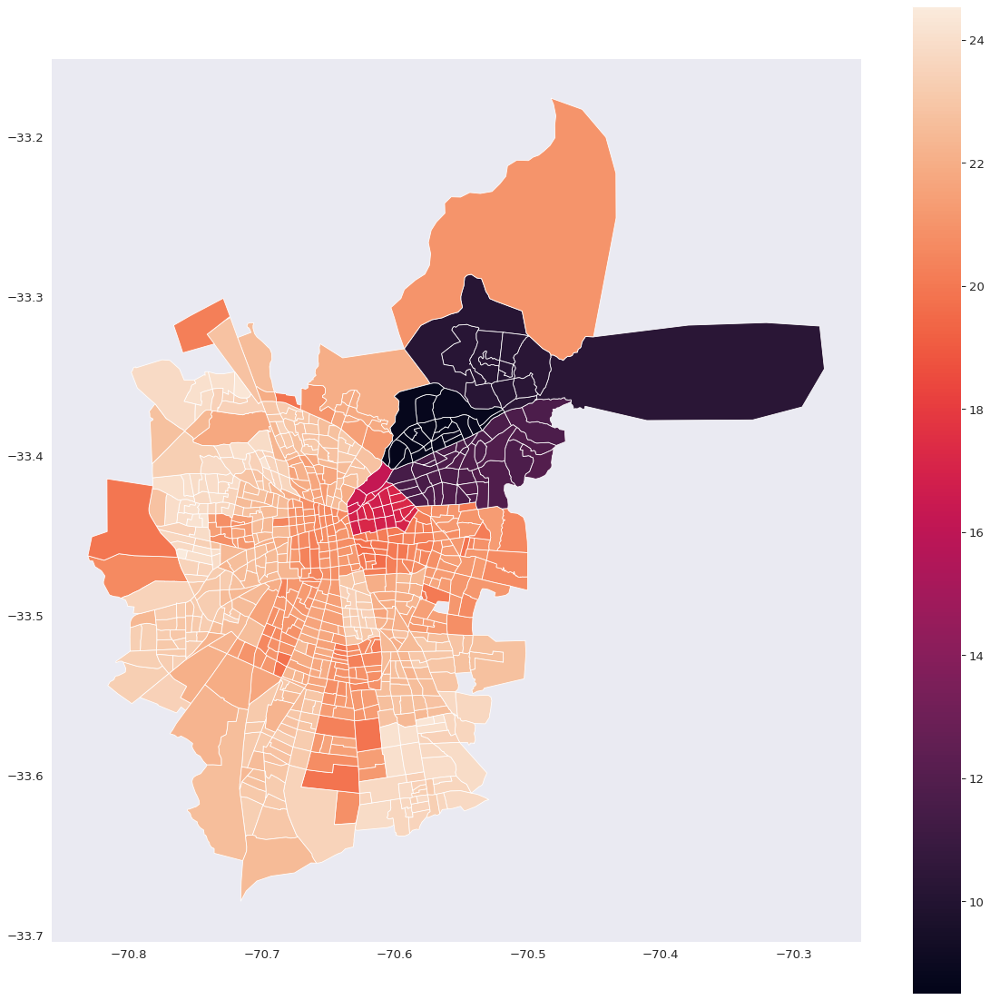

In [324]:
listoco.plot(column = 'g_d_c', legend = True, figsize = (20,20))

Nuevamente podemos ver la división entre los dos sectores de Santiago. Algo bastante propio de nuestro país, que se ha acentuado extremadamente en el último tiempo. El sector oriente de Santiago, destaca por sus pocas **ganas de cambio** en comparación al resto de Santiago. Esta figura es realmente impactante. 

Procedemos ahora con el siguiente paso. Este sería ver a través de que zonas cruza cada linestring de los trazados de Red. Y luego calcular el promedio de nuestro índice. Para ello usaremos una técnica bastante parecida a la que usamos para obtener los vecinos de cada zona en la M2.

Para ello usaremos el diccionario creado en la misión 2: `diccio` que contiene el ID de cada zona como llave y como valor su valor su geometría respectiva.


In [278]:
print(diccio)

{318: <shapely.geometry.polygon.Polygon object at 0x7fb53be665f8>, 311: <shapely.geometry.polygon.Polygon object at 0x7fb53be66e10>, 301: <shapely.geometry.polygon.Polygon object at 0x7fb53468a7b8>, 316: <shapely.geometry.polygon.Polygon object at 0x7fb53468a940>, 330: <shapely.geometry.polygon.Polygon object at 0x7fb53468a748>, 329: <shapely.geometry.polygon.Polygon object at 0x7fb53f7269e8>, 328: <shapely.geometry.polygon.Polygon object at 0x7fb531e84c88>, 335: <shapely.geometry.polygon.Polygon object at 0x7fb531e84940>, 644: <shapely.geometry.polygon.Polygon object at 0x7fb531e84b00>, 650: <shapely.geometry.polygon.Polygon object at 0x7fb531e847b8>, 332: <shapely.geometry.polygon.Polygon object at 0x7fb531e846a0>, 325: <shapely.geometry.polygon.Polygon object at 0x7fb531e9c9e8>, 681: <shapely.geometry.polygon.Polygon object at 0x7fb531e9ca20>, 673: <shapely.geometry.polygon.Polygon object at 0x7fb531e9c898>, 309: <shapely.geometry.polygon.Polygon object at 0x7fb531e9c8d0>, 676: <sha

Luego creamos la función `encontrar_gdc`, que recibe la geometría de un trazado en particular de Red, nuestro diccio y `listoco`. Esta función encuentra primero todas las zonas por las cuales cruza el trazado de Red y luego obtiene el promedio de todas los valores de **ganas_de_cambio**, de las zonas por las cuales pasa el trazado. Este último valor es el que retorna.

In [301]:
def encontrar_gdc(trazado, dicciozonas = diccio, df = listoco):
  zonas = []
  for id in dicciozonas.keys():
    if trazado.intersects(dicciozonas[id]):
      zonas.append(int(id))
  #print(zonas)
  sumagdc = 0
  div = 0
  for zona in zonas:
    div += 1
    sumagdc += df.loc[df.index == zona, 'g_d_c'].values[0]
  #print(sumagdc)
  #print(div)
  return (sumagdc / div)

Probamos que funciones agregando ciertos prints, para entender su lógica más claramente. Notamos que funciona! Podemos proceder a aplicar esta función a todo nuestro GeoDF, `red`.

In [299]:
encontrar_gdc(red.loc[0, 'geometry'])

[23, 516, 608, 604, 611, 605, 8, 17, 12, 575, 515, 506, 498, 19, 21]
306.4598624762895
15


20.4306574984193

In [302]:
red["g_d_c"] = red['geometry'].apply(lambda x: encontrar_gdc(x))

In [303]:
red.head()

,ROUTE_ID,ROUTE_NAME,SERVICE_NA,UN,OP_NOC,DIST,DISTPAGO,PO_MOD,SENTIDO,COD_USUARI,COD_TS,COD_SINSER,COD_SINRUT,COD_USUSEN,TIPO_SERV,FREC_PM,FREC_PT,PLAZAS_PM,PLAZAS_PT,SEL_PM,SEL_PT,SEN1,VALIDA,geometry,g_d_c
0,1360,410yI,INYECCION,6,None,10.91343,0.0,Sin Modificacion,I,410,B80y,B80c2,B80 C2 00I,410I,3,0.0,0.0,0.0,0.0,0,0,1.0,1,"LINESTRING (-70.70528 -33.40479, -70.70451 -33...",20.430657
1,2754,120R,(M) LA CISTERNA - RENCA,6,None,21.73581,0.0,Sin Modificacion,R,120,B82,B82,B82 00R,120R,1,6.0,6.0,582.0,582.0,1,1,0.0,1,"LINESTRING (-70.66365 -33.53784, -70.66354 -33...",22.158279
2,2762,120I,RENCA - (M) LA CISTERNA,6,None,21.98103,0.0,Sin Modificacion,I,120,B82,B82,B82 00I,120I,1,6.0,6.0,582.0,582.0,1,1,0.0,1,"LINESTRING (-70.73047 -33.40319, -70.73035 -33...",22.141862
3,5320,119R,LO ESPEJO - MAPOCHO,3,None,18.82501,0.0,Sin Modificacion,R,119,319,T319,T319 00R,119R,1,12.0,7.0,1241.0,735.0,1,1,0.0,1,"LINESTRING (-70.70170 -33.53722, -70.69886 -33...",21.101505
4,5322,119I,MAPOCHO - LO ESPEJO,3,None,19.49691,0.0,Sin Modificacion,I,119,319,T319,T319 00I,119I,1,8.0,10.0,849.0,1029.0,1,1,0.0,1,"LINESTRING (-70.64804 -33.43346, -70.64818 -33...",20.920520


Notamos que tenemos una nueva columna de `g_d_c` en nuestro GeoDF de `red`. Debemos ahora crear un ranking. Para ello podemos ordenar la base de datos según su valor de `g_d_c` de manera descendente. Así podremos ver los trazados que probablemente lleven más gente con mayor ganas de cambio, más arriba y los menos más abajo.

In [305]:
red_ordenada = red.sort_values(by=['g_d_c'])

In [312]:
red_ordenada.head()

,ROUTE_ID,ROUTE_NAME,SERVICE_NA,UN,OP_NOC,DIST,DISTPAGO,PO_MOD,SENTIDO,COD_USUARI,COD_TS,COD_SINSER,COD_SINRUT,COD_USUSEN,TIPO_SERV,FREC_PM,FREC_PT,PLAZAS_PM,PLAZAS_PT,SEL_PM,SEL_PT,SEN1,VALIDA,geometry,g_d_c
185,6660,C22I,(M) ESCUELA MILITAR - ROTONDA LO CURRO,6,None,7.398310,0.0,Sin Modificacion,I,C22,B72,B72,B72 00I,C22I,1,7.0,5.0,359.0,245.0,1,1,0.0,1,"LINESTRING (-70.58476 -33.41475, -70.58478 -33...",9.477561
328,7211,C22RPM,VARIANTE PUNTA MAÑANA,6,None,7.224180,0.0,Sin Modificacion,R,C22,B72,B72,B72 01R,C22R,2,6.0,0.0,326.0,0.0,1,0,0.0,1,"LINESTRING (-70.56946 -33.37689, -70.56948 -33...",9.486101
327,7210,C22R,ROTONDA LO CURRO - (M) ESCUELA MILITAR,6,None,7.753766,0.0,Sin Modificacion,R,C22,B72,B72,B72 00R,C22R,1,0.0,5.0,0.0,245.0,0,1,0.0,1,"LINESTRING (-70.56946 -33.37689, -70.56948 -33...",9.486101
311,7180,C14R,LOS TRAPENSES - (M) ESCUELA MILITAR,6,None,14.699370,0.0,Sin Modificacion,R,C14,B64,B64,B64 00R,C14R,1,10.0,12.0,970.0,1164.0,1,1,0.0,1,"LINESTRING (-70.54197 -33.32522, -70.54199 -33...",9.708396
315,7186,C14I,(M) ESCUELA MILITAR - LOS TRAPENSES,6,None,15.391210,0.0,Sin Modificacion,I,C14,B64,B64,B64 00I,C14I,1,12.0,10.0,1164.0,970.0,1,1,0.0,1,"LINESTRING (-70.58131 -33.41297, -70.58166 -33...",9.866997


Armamos el ranking, de los trazados de mayor a menor valor de **ganas_de_cambio**. El ranking esta completo. Se puede notar que tiene 1478 lugares, al igual que el número de observaciones del GeoDF `red`.

In [313]:
lugar = 0
for trazado in red_ordenada.index:
  lugar += 1
  nombre_ruta = red_ordenada.loc[red_ordenada.index == trazado, 'ROUTE_NAME'].values[0]
  print(str(lugar) + '.- '+ str(nombre_ruta))

1.- C22I
2.- C22RPM
3.- C22R
4.- C14R
5.- C14I
6.- C11R
7.- C11I
8.- C07I
9.- C03I
10.- C15R
11.- C08I
12.- C12R
13.- C12I
14.- C08R
15.- C17I
16.- C17R
17.- C19I
18.- C19R
19.- C13R
20.- C13I
21.- C07IPM
22.- C10eR
23.- 405cyR
24.- C03R
25.- C10eI
26.- C16R
27.- C03cI
28.- 411R
29.- C16I
30.- 406cI
31.- C01R
32.- C01cR
33.- C09I
34.- C03cR
35.- C01I
36.- C09R
37.- C01cI
38.- C05I
39.- C18R
40.- C07R
41.- C07RPM
42.- C20I
43.- C15I
44.- 405cR
45.- C18I
46.- C02RPMPRENOC
47.- C02IPMPRENOC
48.- C02R
49.- C02I
50.- 401cR
51.- C02cIPM
52.- 421yI
53.- C02cRPM
54.- 401cI
55.- C02cI
56.- C02cR
57.- C06cI
58.- C06cIPM
59.- 411I_cvd
60.- 411I
61.- C05RPM
62.- C05R
63.- 409R
64.- C06R
65.- C06R_cvd
66.- 409I
67.- C06I
68.- C06RPM
69.- 501R
70.- 430yI
71.- 501I
72.- 430I
73.- 414eR
74.- 502I
75.- 502R
76.- D11R
77.- 405R
78.- 430R
79.- 405I
80.- 435R
81.- 435R_fdo
82.- 426I
83.- D11I
84.- 426RPRN
85.- D08I
86.- 426IPRN
87.- 426R
88.- 406R
89.- 414eI
90.- 435I_fdo
91.- 435I
92.- 216yIPM
93.- 414eI

Si bien lo ideal hubiese sido obtener el valor de g_d_c, con las velocidades promedio entre los dos horarios que implican tiempos de traslado desde o hacia el trabajo (horarios 2 y 4) usando `arcos_final_horario2` y `arcos_final_horario4` , esto no se pudo realizar porque no funcionó nuestra función ´velocidad´ en la M.2b. La lógica para hacer el ranking sería la misma, obviamente.

Ahora generamos la visualización pedida, para ello usamos el método plot, sobre red y coloreamos según la columna `g_d_c`. Hacemos este plot sobre el plot del GeoDF de `revisar`, que contiene solo las zonas que tenían nodos de vialidades (de OSMNX) ubicados dentro de Santiago urbano. Si bien, hay algunos trazado que salen de estas zonas (especialmente a la izquierda del mapa impreso) se puede notar más claramente donde pasan nuestros trazados que llevan gente con más **ganas de cambio** y los trazados que llevan menos gente con ganas de cambio.

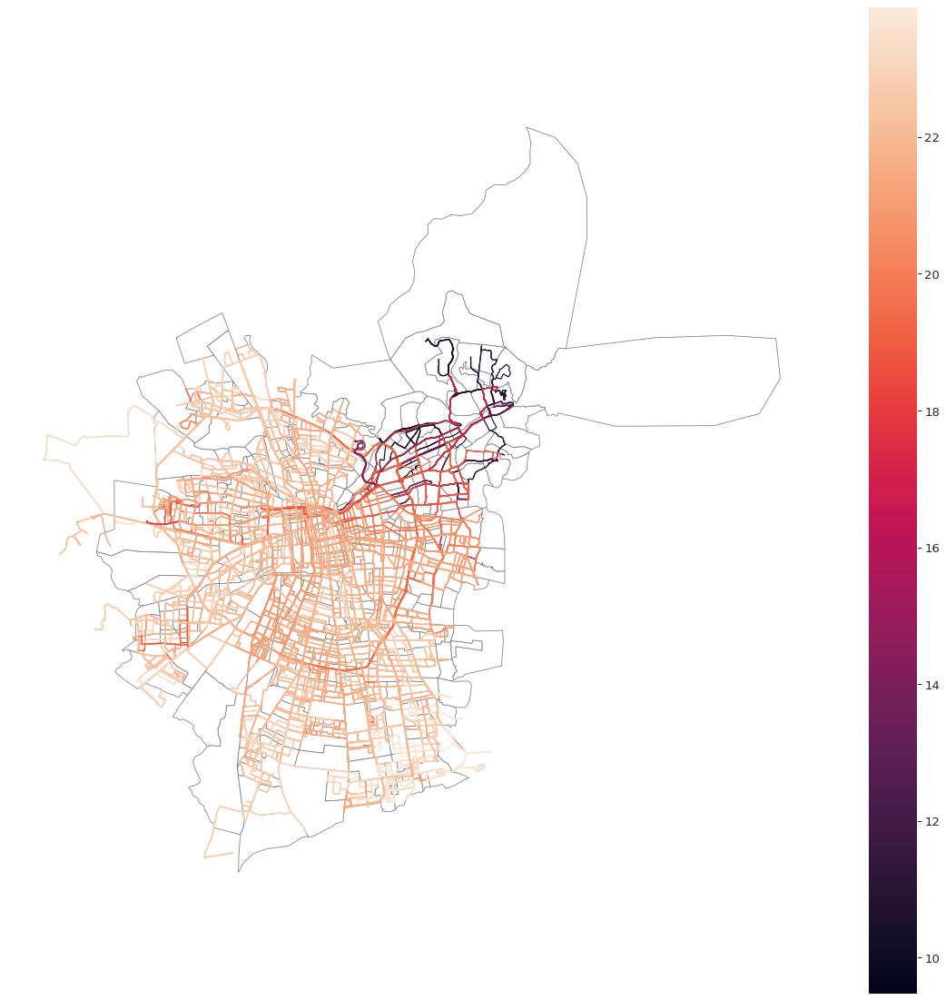

In [323]:
ax = revisar.plot(color = "white", edgecolor = "grey", figsize = (20,20))
red.plot(ax = ax, column = 'g_d_c', legend = True, figsize = (20,20))
plt.axis('off')
plt.show()

Nuevamente, no es la idea ponerme político. Pero llama nuevamente la atención, donde se ubican los trazados que llevan gente con más ganas de cambio y los que llevan menos gente con ganas de cambio. Al parecer el sector oriente esta poblado por gente con pocas ganas de cambio y el sector poniente de Santiago tiene muchas muchas ganas de cambio. Esto es señal de la polarización vivida en el país, la podemos ver a través del resultado de la votación del plebiscito y la visualización realizada en la M3 y ahora con nuestro índice de ganas de cambio en sus trazados de Red, podemos ver esta misma división que se vive hoy en día en Santiago.


## Cierre: 

Estimado Ayudante: Muchas gracias por corregir cada uno de mis trabajos tal lateros y largos. Aprendí demasiado y quedo eternamente agradecido con todo el cuerpo docente. Me alegraron bastante este semestre de encierro, Gracias totales!